In [1]:
import numpy as np
import json
import cv2
import pandas as pd
from scipy import ndimage
import matplotlib.pylab as plt
from numpy import array, zeros, argmin, inf, equal, ndim
from scipy.spatial.distance import cdist

In [2]:
#WITHOUT /
def smooth(x,window_len=6,window='hanning'):
    """smooth the data using a window with requested size.
    
    This method is based on the convolution of a scaled window with the signal.
    The signal is prepared by introducing reflected copies of the signal 
    (with the window size) in both ends so that transient parts are minimized
    in the begining and end part of the output signal.
NOTE: length(output) != length(input), to correct this: return y[(window_len/2-1):-(window_len/2)] instead of just y.
    """ 
     
    if x.ndim != 1:
        raise ValueError("smooth only accepts 1 dimension arrays.")

    if x.size < window_len:
        raise ValueError("Input vector needs to be bigger than window size.")
        
    if window_len<3:
        return x
    
    #if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
    #    raise ValueError, "Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'"
    
    s=np.r_[x[window_len-1:0:-1],x,x[-1:-window_len:-1]]
    #print(len(s))
    if window == 'flat': #moving average
        w=np.ones(window_len,'d')
    else:
        w=eval('np.'+window+'(window_len)')
    
    y=np.convolve(w/w.sum(),s,mode='valid')
    return y  


def _traceback(D):
    i, j = array(D.shape) - 2
    p, q = [i], [j]
    while ((i > 0) or (j > 0)):
        tb = argmin((D[i, j], D[i, j+1], D[i+1, j]))
        if (tb == 0):
            i -= 1
            j -= 1
        elif (tb == 1):
            i -= 1
        else: # (tb == 2):
            j -= 1
        p.insert(0, i)
        q.insert(0, j)
    return array(p), array(q)

def fastdtw(x, y, dist):
    """
    Computes Dynamic Time Warping (DTW) of two sequences in a faster way.
    Instead of iterating through each element and calculating each distance,
    this uses the cdist function from scipy (https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.cdist.html)
    :param array x: N1*M array
    :param array y: N2*M array
    :param string or func dist: distance parameter for cdist. When string is given, cdist uses optimized functions for the distance metrics.
    If a string is passed, the distance function can be 'braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine', 'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 'mahalanobis', 'matching', 'minkowski', 'rogerstanimoto', 'russellrao', 'seuclidean', 'sokalmichener', 'sokalsneath', 'sqeuclidean', 'wminkowski', 'yule'.
    Returns the minimum distance, the cost matrix, the accumulated cost matrix, and the wrap path.
    """
    assert len(x)
    assert len(y)
    if ndim(x)==1:
        x = x.reshape(-1,1)
    if ndim(y)==1:
        y = y.reshape(-1,1)
    r, c = len(x), len(y)
    D0 = zeros((r + 1, c + 1))
    D0[0, 1:] = inf
    D0[1:, 0] = inf
    D1 = D0[1:, 1:]
    D0[1:,1:] = cdist(x,y,dist)
    C = D1.copy()
    for i in range(r):
        for j in range(c):
            D1[i, j] += min(D0[i, j], D0[i, j+1], D0[i+1, j])
    if len(x)==1:
        path = zeros(len(y)), range(len(y))
    elif len(y) == 1:
        path = range(len(x)), zeros(len(x))
    else:
        path = _traceback(D0)
    return D1[-1, -1] / sum(D1.shape), C, D1, path

In [3]:
def plotting(x, y, path, title):
    fig = plt.figure(figsize = (20,10))
    ax = fig.add_subplot(1,2,1)
    plt.plot(x, label = "template")
    plt.plot(y, label = "test")
    plt.legend()
    plt.title(title)
    # plt.show()
    
    ax = fig.add_subplot(1,2,2)
    plt.plot(x[path[0]], label = "template")
    plt.plot(y[path[1]], label = "test")
    plt.legend()
    plt.title(title)
    plt.show()

def dtak_nn_single_joints(play, template, template_label, plot = False):
    result = []
    for joint in range(len(play[0])):
        # joint = 6
        xy = 1
        # distances = []
        test_sequ = play[:, joint]
        test_sequ = (test_sequ-np.mean(test_sequ))/np.std(test_sequ)
        # for i in range(2, 3): #len(labels_first_ten)):
        sequ = template[:,joint]
        sequ = (sequ-np.mean(sequ))/np.std(sequ)
            # plt.plot(sequ, label = i)
        x = sequ
        y = test_sequ
        dist, cost, acc, path = fastdtw(x, y, dist=lambda x, y: np.linalg.norm(x - y))
        # distances.append(np.sum(cost))
        # ind = np.argmin(distances)
        # nn = joints_array_batter[ind, :, joint, xy]
        # nn = (nn-np.mean(nn))/np.std(nn)
        nn_label = template_label #labels_first_ten[ind]
        # print("label nn", nn_label)
        # x = nn
        # y = test_sequ
        if plot:
            plotting(x,y, path, title = joints_list[joint])
        # dist, cost, acc, path = fastdtw(x, y, dist=lambda x, y: np.linalg.norm(x - y))
        
        loc = list(path[0]).index(nn_label)
        # print(loc)
        #print(path[0][loc])
        res = path[1][loc]
        # print("new label", res)
        result.append(res)
    print(result)
    return int(np.median(result))


def normalize(play):
    means = np.mean(play, axis = 0)
    stds = np.std(play, axis = 0)
    return np.array([(elem-means)/stds for elem in play])

def dtak_nn(play, template, template_label, plot = False):
    x = normalize(play[:, :])
    y = normalize(template[:,:])
    dist, cost, acc, path = fastdtw(x, y, 'mahalanobis')  #dist=lambda x, y: np.linalg.norm(x - y))
    if plot:
        plotting(x,y, path, title = "example")
    loc = list(path[0]).index(template_label)
    res = path[1][loc]
    return res

In [4]:
def get_data(index, cf):
    begin_cf = cf.columns.get_loc("0")
    data_array = cf.iloc[index, begin_cf:begin_cf+167].values
    N = len(data_array)

    nr_joints = len(eval(data_array[0]))
    
    data = np.zeros((N,nr_joints,2))

    for j in range(N):
        if not pd.isnull(data_array[j]):
            data[j]=np.array(eval(data_array[j]))
        else:
            data[j] = data[j-1]
    return data

def only_first(move, minimum_sequ_len = 1):
    while True:
        for i in range(minimum_sequ_len):
            if move[0]!=move[1]-1:
                move = np.delete(move, 0)
            else:
                return move[0]
def first_by_grad_old(frames_joints_array, relevant_joints_list, cutoff):
    """ 
    frames_joint_array must have size (nr_frames, 18/12 (joints))
    relevant_joints_list: the joints which should be taken into account for the movement
    """
    #frames_joints_array = ndimage.filters.gaussian_filter1d(frames_joints_array, axis =0, sigma = 3)
    gradients = np.array([np.gradient(frames_joints_array[:,joints_list.index(j)], edge_order = 2) 
                          for j in relevant_joints_list]) #["right_knee", "right_ankle", "left_knee", "left_ankle"]])
    # print(gradients.shape)
    mean_gradient = np.median(gradients, axis=0)
    #print(mean_gradient)
    if cutoff>0:
        move = np.where(mean_gradient>cutoff)[0]
    else: 
        move = np.where(mean_gradient<cutoff)[0] 
    print("first_by_grad", move)
    if len(move)>1:
        return only_first(move)
    elif len(move)==1:
        return move[0]
    else:
        return None
    
def first_by_grad(frames_joints_array, relevant_joints_list = range(0,12,1), cutoff=4, relevant_coordinate=0, minimum_sequ_len=1):
    """
    Returns frame index of batter's first step
    By looking where the mean gradient of the joints in relevant_joints_list is >cutoff
    Works if camera is positioned such that the batter is running to the left or right

    frames_joint_array must have size (nr_frames * nr_joints* nr_coordinates))
    relevant_joints_list: the joints which should be taken into account for the movement
    cutoff: threshold for gradient
    relevant_coordinate: set to the index corresponding to the x coordinate (left-right)
    """
    while True:
        gradients = np.array([np.gradient(frames_joints_array[:,j, relevant_coordinate], edge_order = 2)
                              for j in relevant_joints_list])
        mean_gradient = np.median(gradients, axis=0)
        move = np.where(np.absolute(mean_gradient)>cutoff)[0]
        if cutoff< 1: # cannot be found at all
            return None
            break
        if len(move)!=0: # found one
            break
        cutoff-= 0.3 # if nothing found, lower the threshold

    if len(move)==1:
        return move[0]
    while len(move)>minimum_sequ_len: # find sequence of length> minimum_sequ_len
        for i in range(minimum_sequ_len):
            if move[i]!=move[i+1]-1:
                move = np.delete(move, 0)
                break
            elif i==minimum_sequ_len-1:
                return move[0]
    return move[0]
    
def find_null(joint_array):
    xn = normalize(joint_array)
    res = []
    for j in range(xn.shape[1]):
        res.append(np.argmin(np.absolute(xn[:,j])))
    return int(np.median(res))

def align_sequence_simple(joint_array, template, label):
    xn = normalize(template)
    yn = normalize(joint_array)
    distance_label = [np.linalg.norm((xn[label]-yn[j])[0]) for j in range(len(xn))]
    inds = np.argsort(distance_label)
    print(inds[:6])
    return int(np.mean(inds[:6]))

def simple_shift(joint_array, template, label):
    xn = normalize(template)# [90:160]
    yn = normalize(joint_array)
    
    gradx = np.gradient(xn, axis = 0)
    grady = np.gradient(yn, axis = 0)
    minx = np.argmin(np.mean(gradx, axis = 1))
    miny = np.argmin(np.mean(grady, axis = 1))
    grad_shift = minx-miny

    diff = []
    #plt.figure(figsize = (20,10))
    #plt.plot(np.mean(xn, axis = 1), linewidth = 4)
    
    for i in range(-20, 20):
        new = np.roll(yn, i, axis = 0)
        #plt.plot(np.mean(new, axis =1), label = i)
        diff.append(np.mean(np.absolute(new-xn)))
    #plt.legend()
    #plt.show()
    #print(diff)
    #print(np.argmin(diff))
    lab_rolls = np.argmin(diff)-20
    return label- int(np.mean([lab_rolls, grad_shift]))

"""def align_sequence_old(joint_array, template, label):
    xn = normalize(template)
    yn = normalize(joint_array)
    distances = []
    for i in range(len(xn)):
        distances.append([np.linalg.norm((yn[i]-xn[j])[0]) for j in range(len(xn))])
    distances = np.array(distances)
    indizes = []
    for i in range(len(xn)):
        indizes.append(np.argmin(distances[i]))
    res = []
    print(indizes, label)
    for ind in range(label-5, label+5):
        try:
            res.append(indizes.index(ind))
        except ValueError:
            continue
    return int(np.mean(res))"""

'def align_sequence_old(joint_array, template, label):\n    xn = normalize(template)\n    yn = normalize(joint_array)\n    distances = []\n    for i in range(len(xn)):\n        distances.append([np.linalg.norm((yn[i]-xn[j])[0]) for j in range(len(xn))])\n    distances = np.array(distances)\n    indizes = []\n    for i in range(len(xn)):\n        indizes.append(np.argmin(distances[i]))\n    res = []\n    print(indizes, label)\n    for ind in range(label-5, label+5):\n        try:\n            res.append(indizes.index(ind))\n        except ValueError:\n            continue\n    return int(np.mean(res))'

In [ ]:
videos_b = np.array([np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/batter_example.npy")])
game_id = "490509-3f640b3f-9ba5-4e89-8f72-97c9f333aa2c"
center_csv = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/cf_data.csv")
center_csv = center_csv[center_csv["Player"]=="Batter"]
games_batter = center_csv["Game"].values.tolist()
ind = games_batter.index(game_id)
joints_array_batter = np.array([get_data(ind, center_csv)])
joints_array_batter = ndimage.filters.gaussian_filter1d(joints_array_batter, axis =1, sigma = 3)
print(joints_array_batter.shape, videos_b.shape)

In [ ]:
# path="/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/out_joints_sv/batter/"
# path_videos = "/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/out_joints_sv/numpy_arrays_batter/"
#path="/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/batter/"
#path_videos = "/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/batter/"
path = "/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/out_testing_batter/"
path_videos = path
from os import listdir
import codecs
import json
videos_b = []
joints_array_batter = []
files = []
csv = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/csvs/csv_new_videos.csv")
#csv = csv[csv["Player"]=="Batter"]
hit_into = []
play_outcome = []
outcomes = csv["Play Outcome"].values
release = []

with open(path+"release_frames", "r") as infile:
    release_frame = json.load(infile)

for fi in listdir(path):
    if fi[-5:]==".json":
        files.append(fi[:-5])
        line = csv[csv["play_id"]==fi[:-5]]
        try:
            hit_into.append(line["Hit into play?"].values[0])
            release.append(release_frame[fi[:-5]])
        except IndexError:
            continue
        except KeyError:
            continue
            
        play_outcome.append(line["Play Outcome"].values[0])
        videos_b.append(np.load(path_videos+fi[:-5]+"_video.npy"))
        obj_text = codecs.open(path+fi, encoding='utf-8').read()
        joints_array_batter.append(json.loads(obj_text))

# 88009707-e682-405a-8644-92d5b20a155e_video.npy
# "88009707-e682-405a-8644-92d5b20a155e.json"

joints_array_batter = np.array(joints_array_batter)
videos_b = np.array(videos_b)
joints_array_batter = ndimage.filters.gaussian_filter1d(joints_array_batter, axis =1, sigma = 3)
print(videos_b.shape, joints_array_batter.shape)
print(hit_into)
print(play_outcome)
print(release)

In [6]:
def from_json(file):
    coordinates = ["x", "y"]
    joints_list = ["right_shoulder", "right_elbow", "right_wrist", "left_shoulder","left_elbow", "left_wrist",
            "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle",
            "right_eye", "right_ear","left_eye", "left_ear", "nose ", "neck"]
    with open(file, 'r') as inf:
        out = json.load(inf)

    liste = []
    for fr in out["frames"]:
        l_joints = []
        for j in joints_list[:12]:
            l_coo = []
            for xy in coordinates:
                l_coo.append(fr[j][xy])
            l_joints.append(l_coo)
        liste.append(l_joints)

    return np.array(liste)

import os
files = []
videos_b = []
joints_array_batter = []
path = "/Volumes/Nina Backup/low_quality_testing/batter_runs/"
path_list = os.listdir(path)
print(len(path_list))

310


In [7]:
videos_b = []
joints_array_batter = []
with open("labels_first_batter_test", "r") as infile:
    labels_first_move = json.load(infile)
files = []
for f in path_list[260:]:
    if f[-5:]!=".json" or "video" in f:
        continue
    name = f[:-5]
    if not name in list(labels_first_move.keys()):
        print("not valid")
        continue
    files.append(name)
    with open(path+name+"_video.json", "r") as infile:
        videos_b.append(json.load(infile))
    joints_array_batter.append(from_json(path+ f))
# print(videos_b, joints_array_batter)

not valid
not valid
not valid
not valid
not valid
not valid
not valid


# 

c6ea2485-4ce1-4edd-b103-5cee4e9b22fb


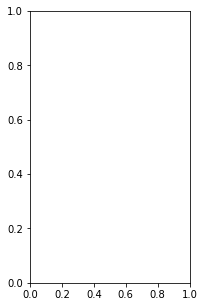

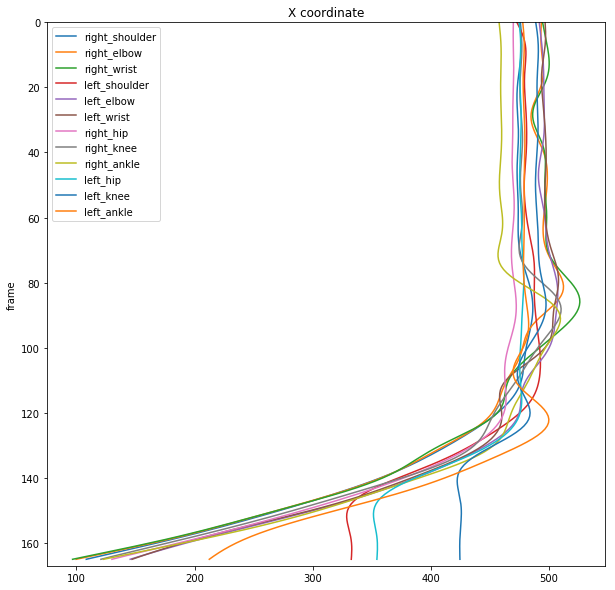

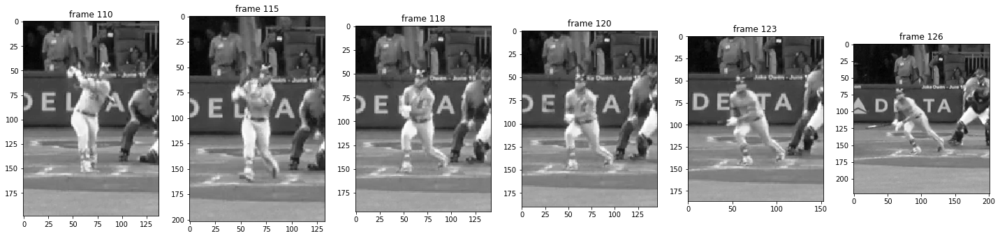

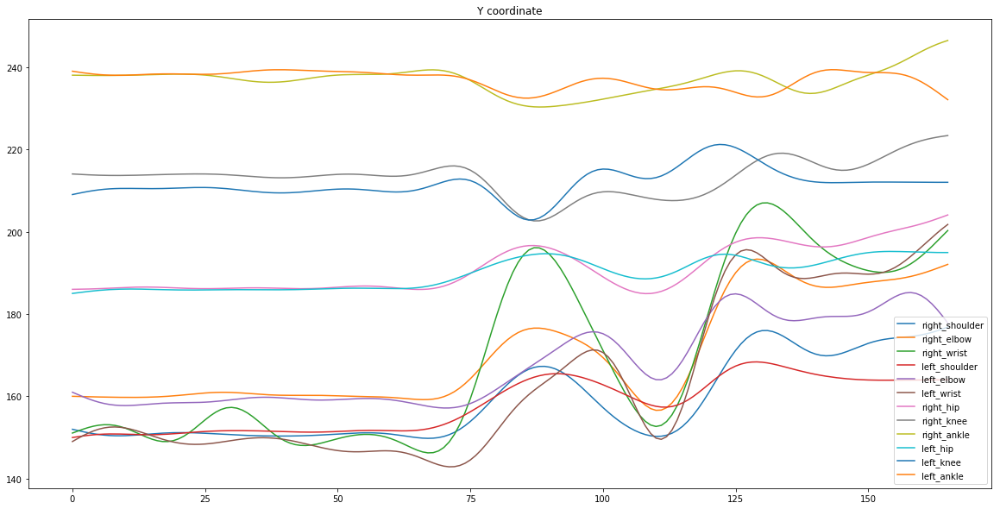

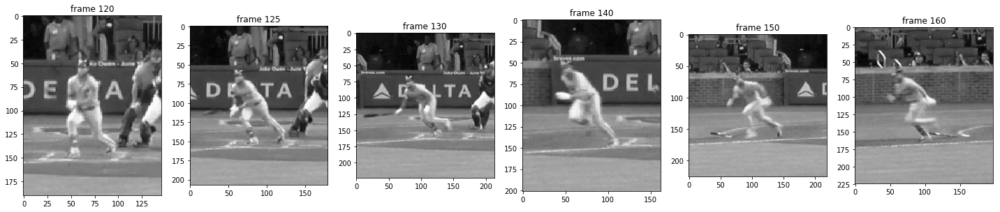

In [13]:
#print(np.sum(np.array(hit_into)=="yes"))
import matplotlib.pylab as plt

joints_list = ["right_shoulder", "right_elbow", "right_wrist", "left_shoulder","left_elbow", "left_wrist",
        "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle", "neck ",
        "right_eye", "right_ear","left_eye", "left_ear"]
# print(files)
one_joint = "left_knee"
video_choice = 0 #files.index("60c8b309-e459-4a30-b05f-4f6cfaf4ad95")
#SMOOTHING
print(files[video_choice])

plt.figure(figsize = (10,10))
for j in joints_list[:12]:
    plt.plot(joints_array_batter[video_choice][:,joints_list.index(j), 0], np.arange(0,len(joints_array_batter[video_choice]),1), label = j)
plt.title("X coordinate")
plt.ylim(167,0)
plt.ylabel("frame")
plt.legend()
plt.show()

# Plot video frames to visualize maxima in X coordinates
show_frames = [110, 115, 118, 120, 123, 126]
fig = plt.figure(figsize=(20, 5))
for ind, i in enumerate(show_frames):
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(videos_b[video_choice][i])
    plt.title("frame "+str(i))
    plt.gray()
plt.tight_layout()
plt.show()


plt.figure(figsize = (20,10))
for j in joints_list[:12]: #[one_joint]: 
    plt.plot(joints_array_batter[video_choice][:,joints_list.index(j), 1], label = j)
plt.legend()
#plt.ylim(140, 30)
plt.title("Y coordinate")
plt.show()

# Plot video frames to visualize maxima in Y coordinates
show_frames = [ 120, 125, 130, 140, 150, 160]
fig = plt.figure(figsize=(20, 5))
for ind, i in enumerate(show_frames):
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(videos_b[video_choice][i])
    plt.title("frame "+str(i))
plt.tight_layout()
plt.show()

# Foot down


 
 
 

--------------NEW VIDEO ------------------
c6ea2485-4ce1-4edd-b103-5cee4e9b22fb
length data (166, 12, 2)
70 90 128
in function: first step 128 foot highest 87 foot down 96
first step 128 foot highest 87 foot down 96
--------------moment batter puts foot down 96 ------------------


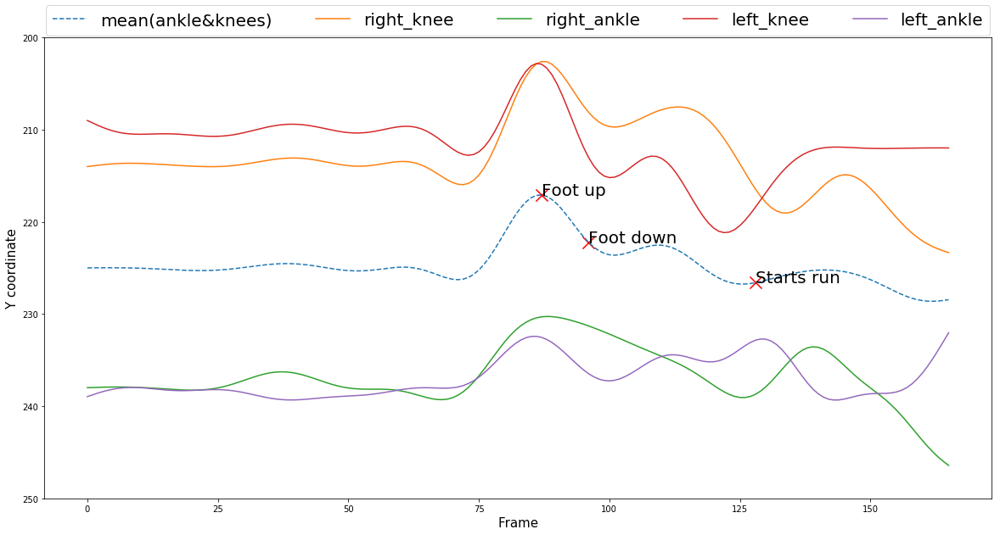

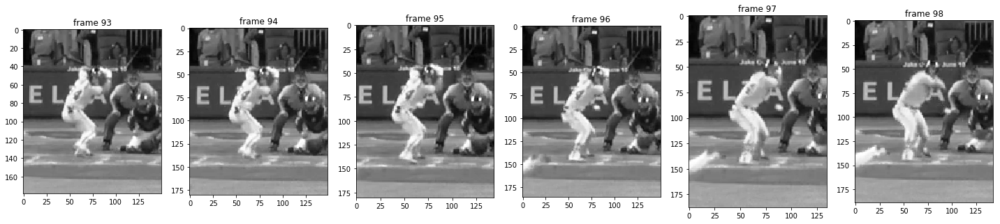


 
 
 

--------------NEW VIDEO ------------------
2389e257-62e1-4b49-ac68-a360b0499960
length data (163, 12, 2)
70 90 121
in function: first step 121 foot highest 92 foot down 101
first step 121 foot highest 92 foot down 101
--------------moment batter puts foot down 101 ------------------


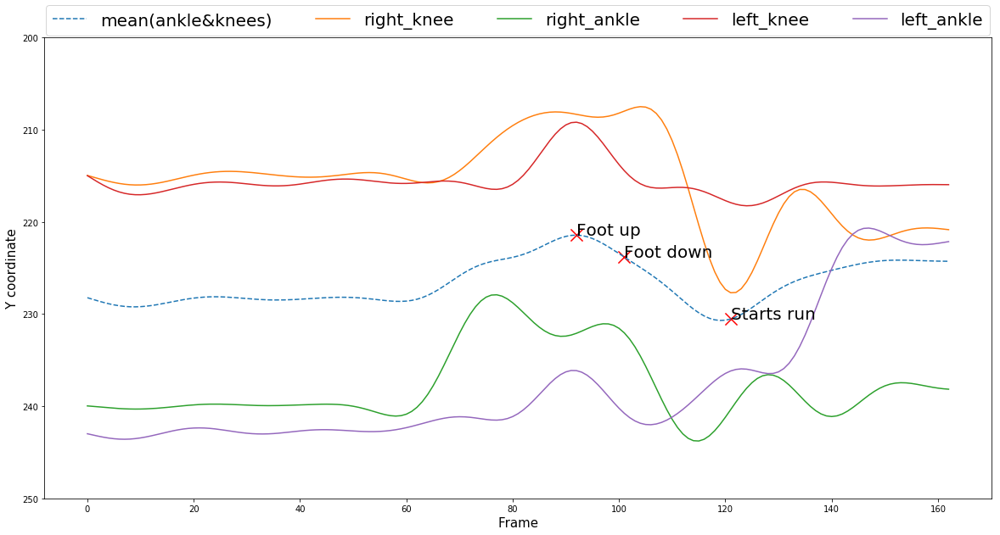

KeyboardInterrupt: 

In [46]:
def foot_to_ground(batter, release = 90, start_run = None, relevant_joints = [7,10, 8,11], relevant_coordinate = 1):
    """
    returns frame the batter's leg is highest before the swing, and then the moment the foot is back on the ground
    (back to ground is a maximum of 10 frames later than the leg highest)
    for this analysis, an estimaet for the release frame is required, plus the moment the batter starts to run is helpful
    (if not given, release_frame+30 is taken)
    
    batter: array of nr_frames*nr_joints*nr_coordinates
    release: 
    relevant_joints_list: the joints which should be taken into account for the movement
    relevant_coordinate: set to the index corresponding to the x coordinate (left-right)
    
    OTHER VERSION:
    idea: take only left or right foot, depending which one is lifted more (problem: position of foot in beginning)
    in arguments: relevant_joints = [[7,10],[8,11]]
    
    mean_right = np.mean(batter[:, relevant_joints[0], 1], axis=1)
    mean_left = np.mean(batter[:, relevant_joints[1], 1], axis=1)
    print(mean_right.shape)
    means = np.array([mean_right, mean_left])
    print(means.shape)
    means_means = np.mean(means[:, :release-20], axis = 1)
    start = release-20
    left_or_right = np.argmin(np.amin(means[:, start:first_move] - np.swapaxes(np.array([means_means for _ in range(50)]), 0,1), axis = 1))
    print("left_right", left_or_right)
    print(np.amin(means, axis = 1).shape)
    print("minimums", np.amin(means, axis = 1))
    foot_up = start + np.argmin(means[left_or_right, start:first_move])
    print("foot_up", foot_up)
    mean_ground = np.mean(means[left_or_right, :foot_up-10])
    print("mean", mean_ground)
    
    #foot_down_gradient = first_move_batter_gradient(batter[:first_move],  relevant_joints_list=relevant_joints, relevant_coordinate=1, cutoff=4, minimum_sequ_len=1)
    foot_down_gradient = foot_up + np.argmin(np.absolute(means[left_or_right, foot_up:foot_up+10]-mean_ground))# foot_up - 2+ np.where(np.gradient(target_sequence)[foot_up-70+2:]<0.1)[0][0]

    plt.plot(means[left_or_right, foot_up:foot_up+10])
    plt.plot([mean_ground for _ in range(10)])
    plt.show()
    """
    if start_run is None: 
        start_run = release+30
    leg_sequence = np.mean(batter[:, relevant_joints, relevant_coordinate], axis=1)
    start = release-20
    print(start, release, start_run)
    foot_up = start + np.argmin(leg_sequence[start:start_run])
    if foot_up>first_move-5:
        print("Too close to first step, not possible")
        return None, None
    mean_ground = np.mean(leg_sequence[:foot_up-10])
    foot_down_gradient = foot_up + np.argmin(np.absolute(leg_sequence[foot_up:foot_up+10]-mean_ground))
    print("in function: first step", start_run, "foot highest", foot_up, "foot down", foot_down_gradient)
    return foot_up, foot_down_gradient

relevant_joints = [7,8, 10,11]
with open("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/train_data/labels_first_batter_test", "r") as infile:
    labels_test = json.load(infile)
for video_choice in range(len(joints_array_batter)):
    #if hit_into[video_choice]=="no" or "Foul" in play_outcome[video_choice] or files[video_choice] in wrong_guy or "Field out" in play_outcome[video_choice]:
     #   print(play_outcome[video_choice], files[video_choice])
        #  continue
    print("\n \n \n \n")
    print("--------------NEW VIDEO ------------------")
    print(files[video_choice])
    # print(play_outcome[video_choice])
    batter = joints_array_batter[video_choice]
    print("length data", batter.shape)
    
    first_move = int(labels_test[files[video_choice]])
    
    foot_up, foot_down_gradient = foot_to_ground(batter, release = 90, start_run = first_move)
    
    if foot_up is None:
        continue
    # relevant_joints = [[7,10],[8,11]]
    
    print("first step", first_move, "foot highest", foot_up, "foot down", foot_down_gradient)
    result_list =  [foot_up, foot_down_gradient, first_move]  
    print("--------------moment batter puts foot down", foot_down_gradient, "------------------")
    plt.figure(figsize = (20,10))
    mean_traj = np.mean(batter[:, relevant_joints, 1], axis=1)
    plt.plot(mean_traj, linestyle="--", label="mean(ankle&knees)")
    for j in relevant_joints:
        plt.plot(batter[:,j, 1], label = joints_list[j])
    plt.scatter(result_list, mean_traj[result_list],s=200, marker='x', color = "red")
    n = ["Foot up", "Foot down", "Starts run"]
    for i, txt in enumerate(n):
        plt.annotate(txt, (result_list[i], mean_traj[result_list[i]]), fontsize=20)
    plt.legend(bbox_to_anchor=(0., 1.0, 1., 1.0), loc=3, ncol=7, mode="expand", borderaxespad=0.1, fontsize=20)
    # plt.title("Y gradient")
    plt.xlabel("Frame", fontsize=15)
    plt.ylabel("Y coordinate", fontsize=15)
    plt.ylim(250,200)
    plt.show()

    show_frames = range(foot_down_gradient-3, foot_down_gradient+3)
    fig = plt.figure(figsize=(20, 5))
    for ind, i in enumerate(show_frames):
        ax = fig.add_subplot(1,len(show_frames),ind+1)
        plt.imshow(videos_b[video_choice][i])
        plt.gray()
        plt.title("frame "+str(i))
    plt.tight_layout()
    plt.show()

# Starts run


 
 
 

--------------NEW VIDEO ------------------
c6ea2485-4ce1-4edd-b103-5cee4e9b22fb
length data (166, 12, 2)
--------------START RUN: network: 120 , gradient:  128 ------------------


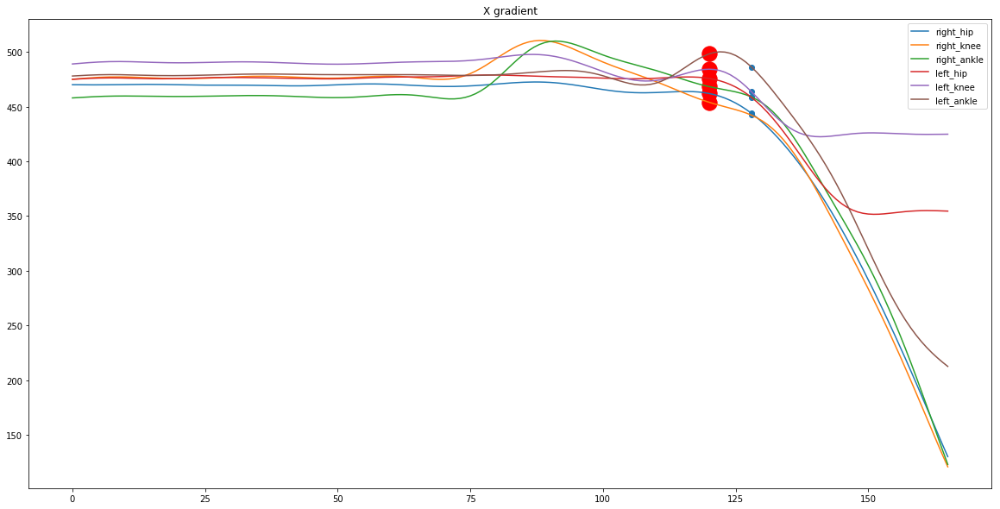

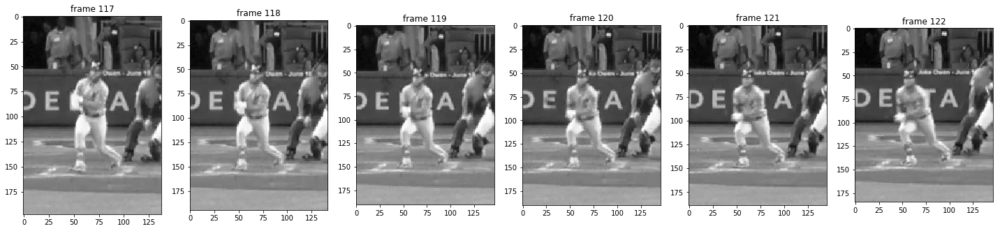


 
 
 

--------------NEW VIDEO ------------------
2389e257-62e1-4b49-ac68-a360b0499960
length data (163, 12, 2)
--------------START RUN: network: 119 , gradient:  121 ------------------


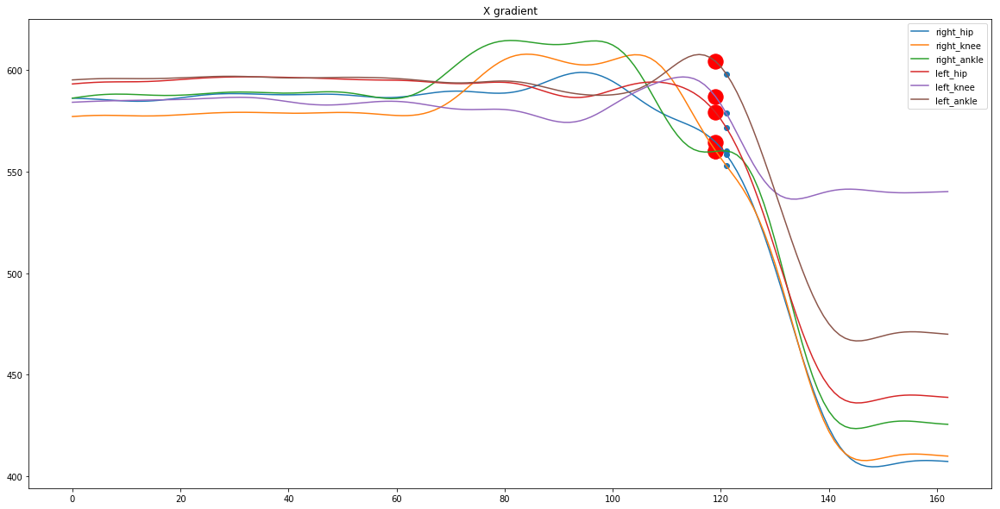

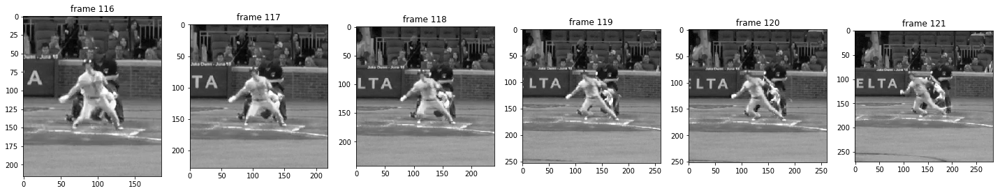


 
 
 

--------------NEW VIDEO ------------------
651bb6ba-c99b-4c16-a550-fee495a5bb59
length data (163, 12, 2)
--------------START RUN: network: 124 , gradient:  123 ------------------


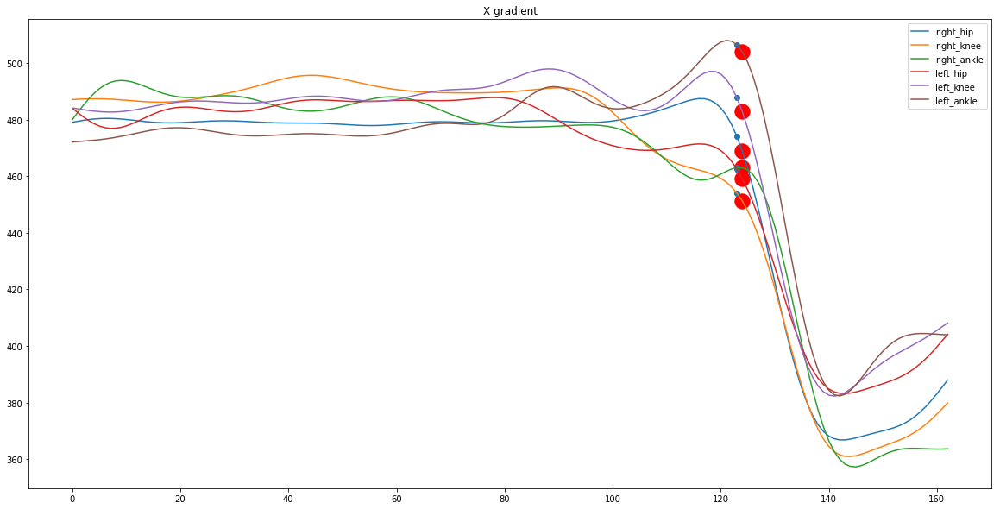

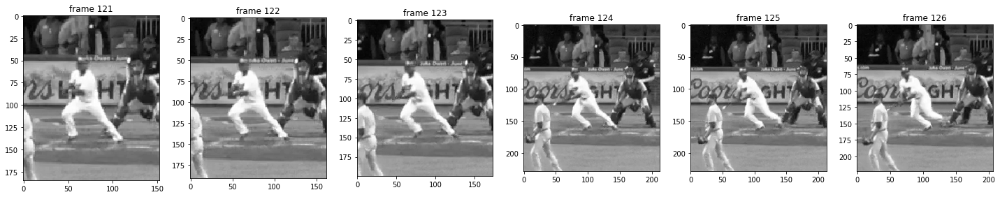


 
 
 

--------------NEW VIDEO ------------------
9c3e389f-32e8-4f3c-b9d3-8c525f8891eb
length data (164, 12, 2)
--------------START RUN: network: 123 , gradient:  124 ------------------


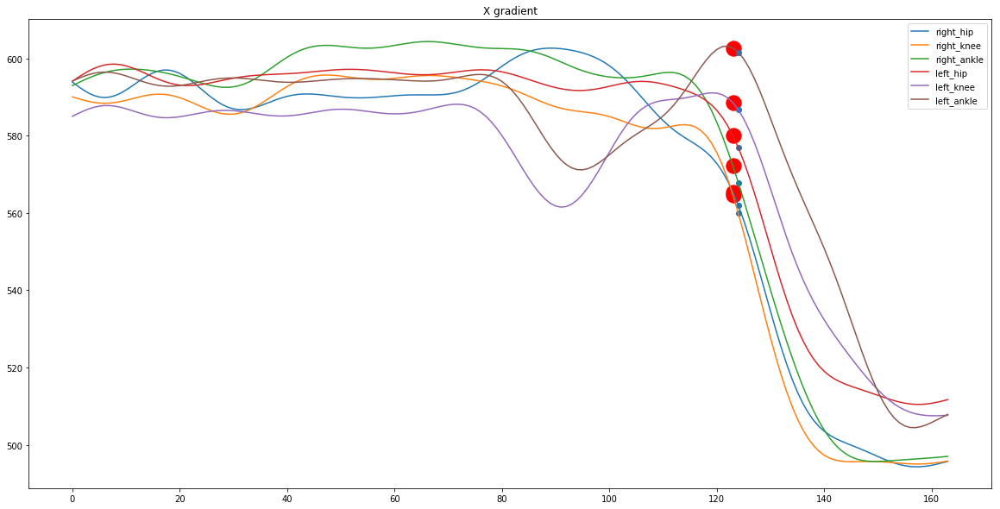

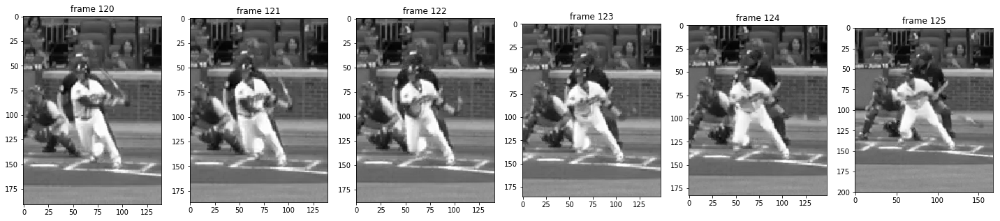


 
 
 

--------------NEW VIDEO ------------------
f4ea3410-f559-464f-acb0-74133d7742e3
length data (166, 12, 2)
--------------START RUN: network: 127 , gradient:  129 ------------------


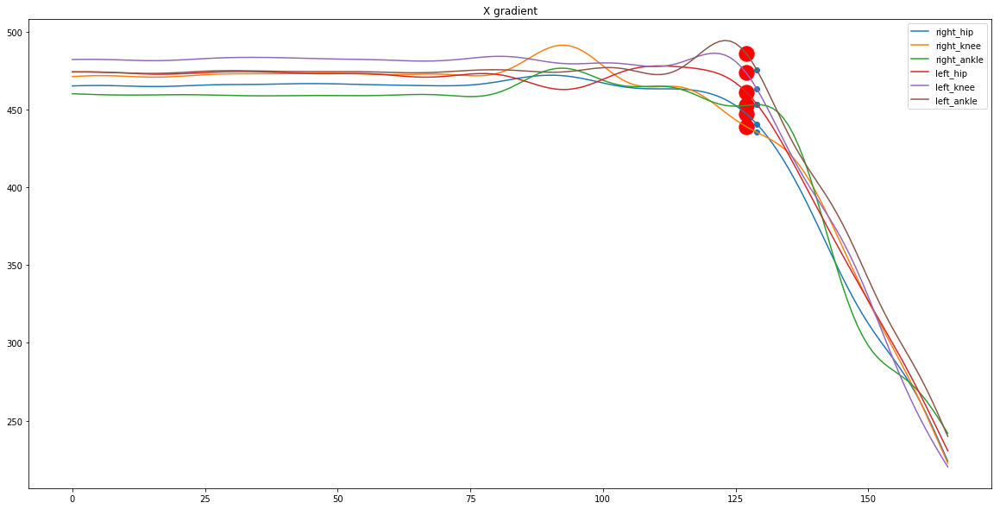

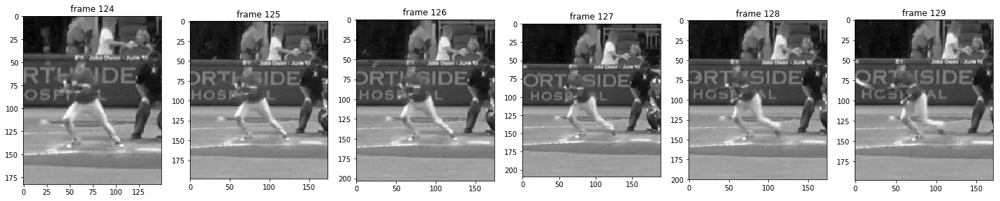


 
 
 

--------------NEW VIDEO ------------------
e420776f-67d8-4833-96fd-88da20de95a1
length data (164, 12, 2)
--------------START RUN: network: 130 , gradient:  129 ------------------


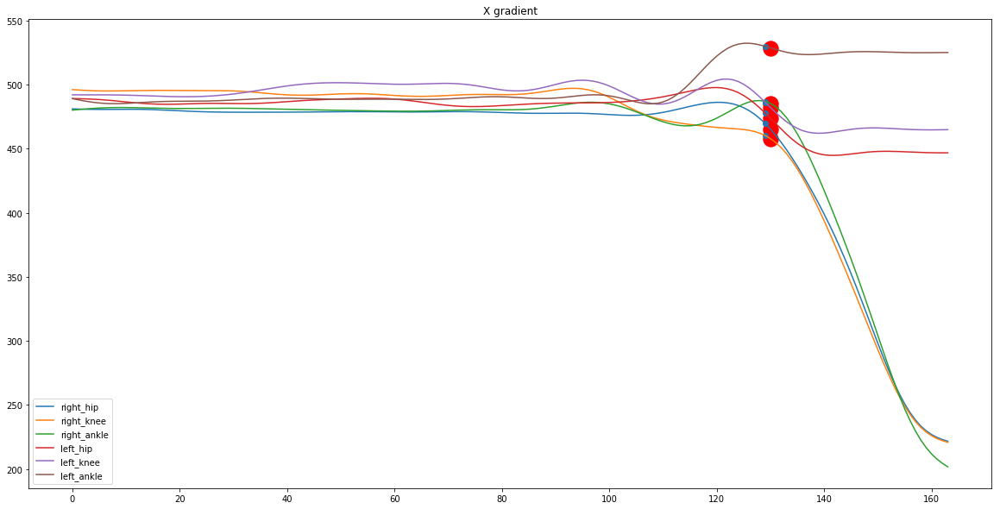

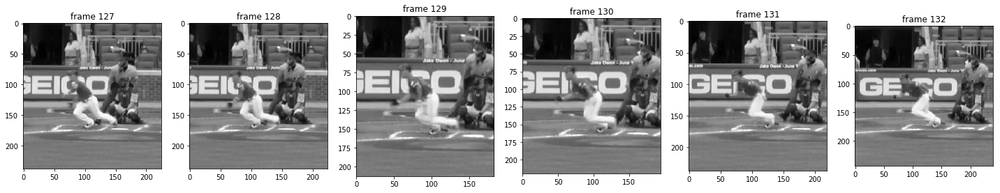


 
 
 

--------------NEW VIDEO ------------------
72d2b9d0-1fb0-469b-9f79-35b9502124ab
length data (165, 12, 2)
--------------START RUN: network: 113 , gradient:  114 ------------------


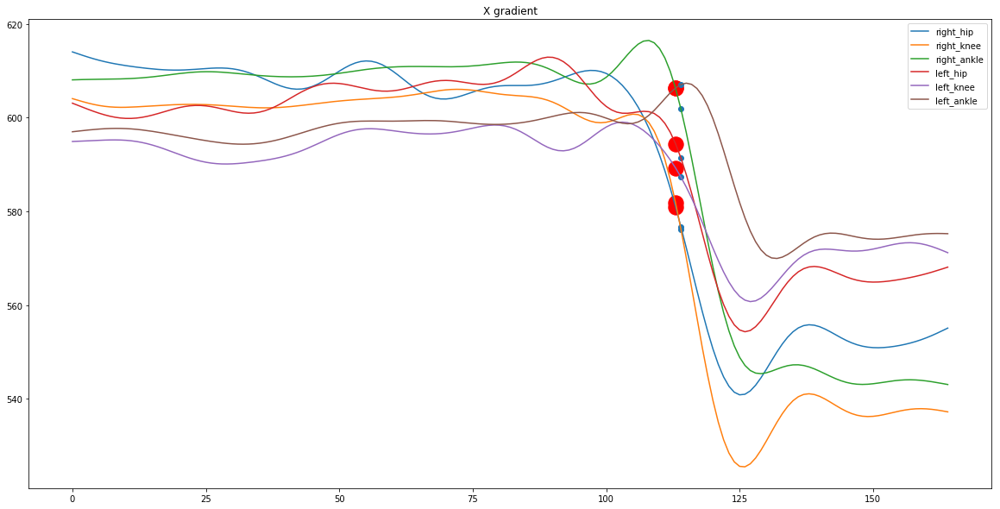

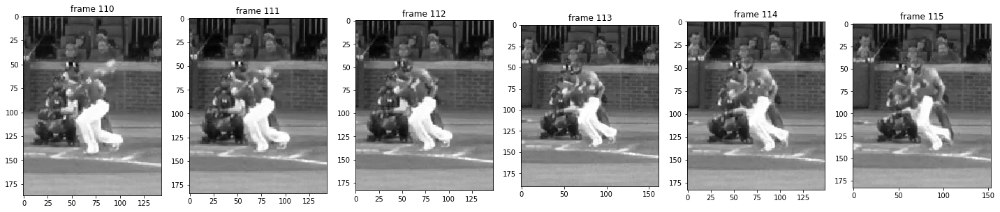


 
 
 

--------------NEW VIDEO ------------------
3bca3062-d7aa-46c9-b729-85373e0dbd87
length data (166, 12, 2)
--------------START RUN: network: 124 , gradient:  127 ------------------


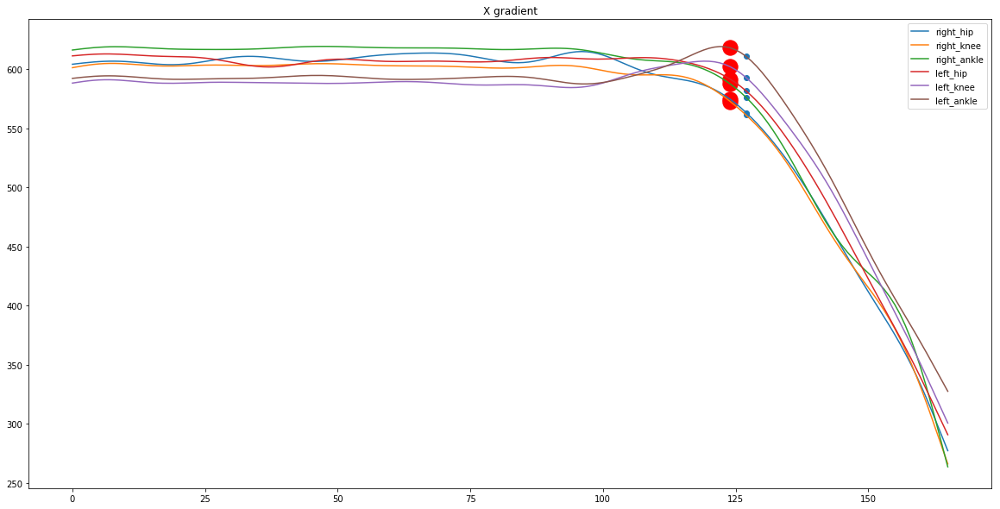

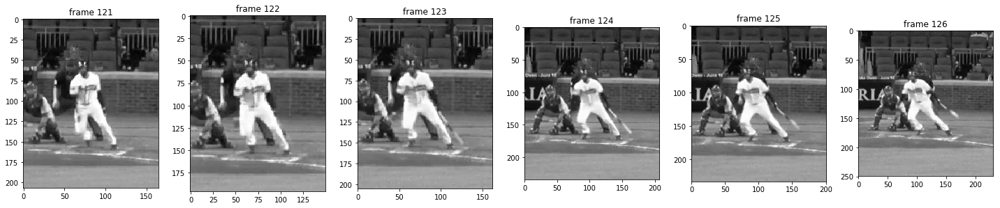


 
 
 

--------------NEW VIDEO ------------------
da908ac0-eae5-4742-a57e-8ccda56108e0
length data (166, 12, 2)
--------------START RUN: network: 125 , gradient:  124 ------------------


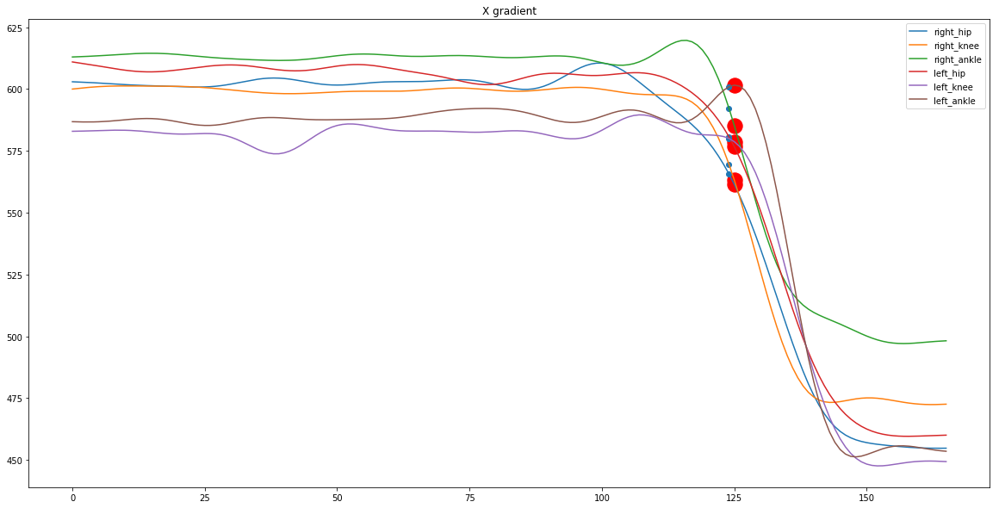

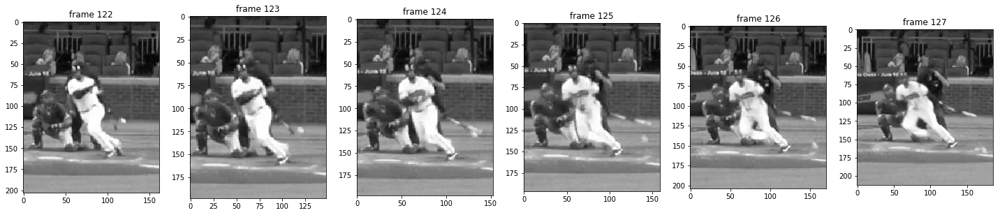


 
 
 

--------------NEW VIDEO ------------------
4ed99ce5-a558-445e-a83e-7b1608c9427e
length data (166, 12, 2)
--------------START RUN: network: 122 , gradient:  123 ------------------


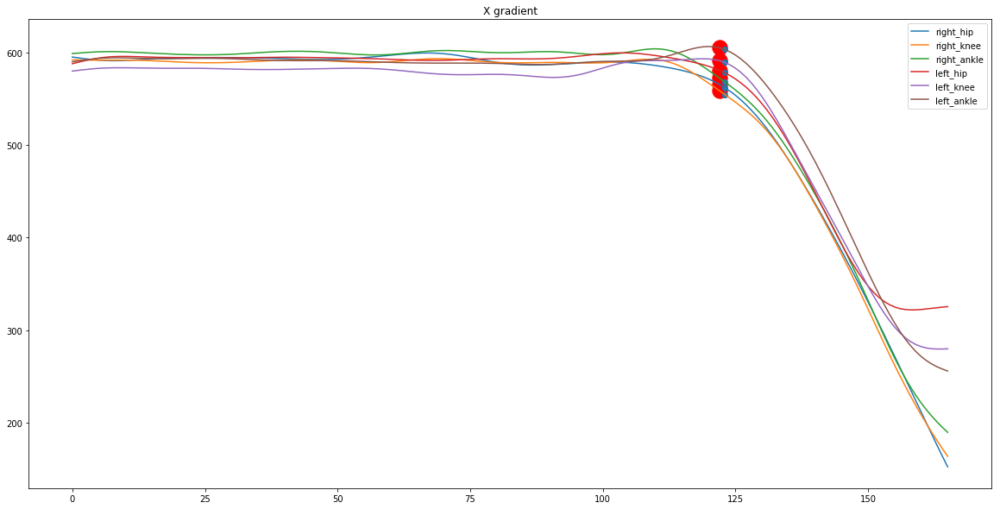

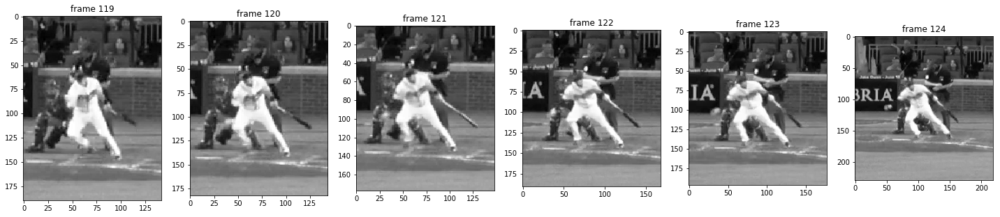


 
 
 

--------------NEW VIDEO ------------------
4343a6e2-17fd-45a6-891f-6619f1be9755
length data (163, 12, 2)
--------------START RUN: network: 125 , gradient:  125 ------------------


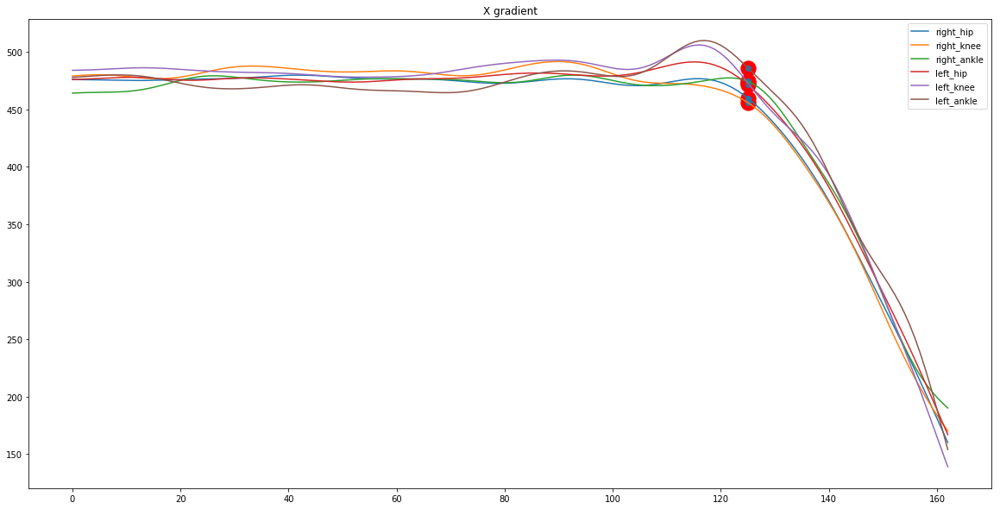

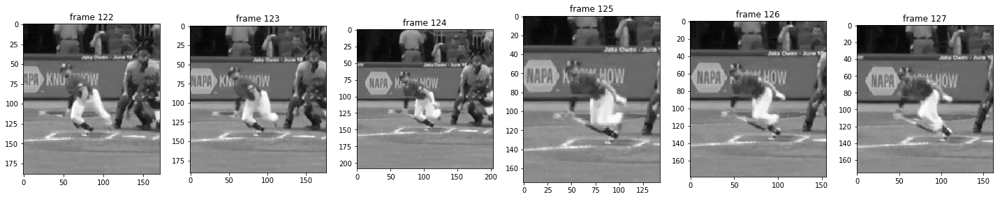


 
 
 

--------------NEW VIDEO ------------------
97507655-eed9-42d5-82b9-6da6c8349ba2
length data (166, 12, 2)
--------------START RUN: network: 126 , gradient:  126 ------------------


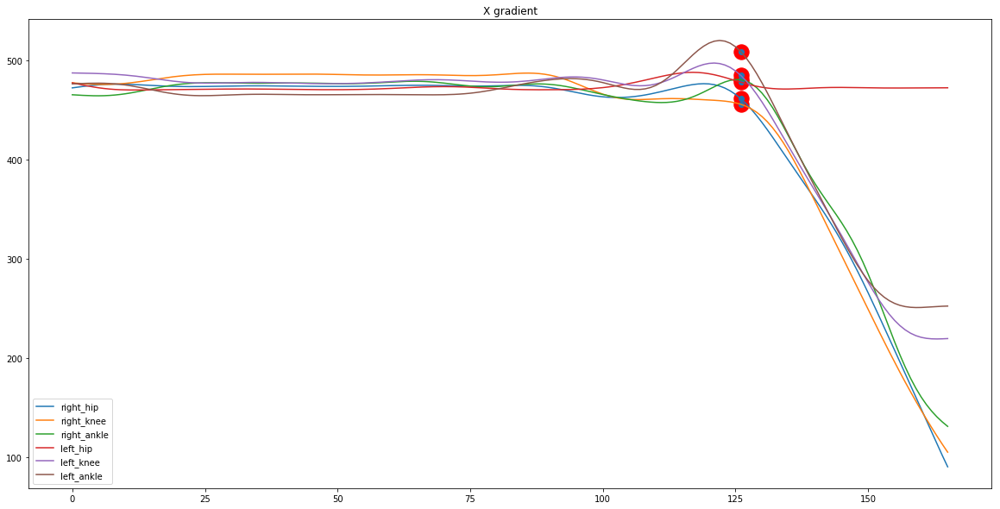

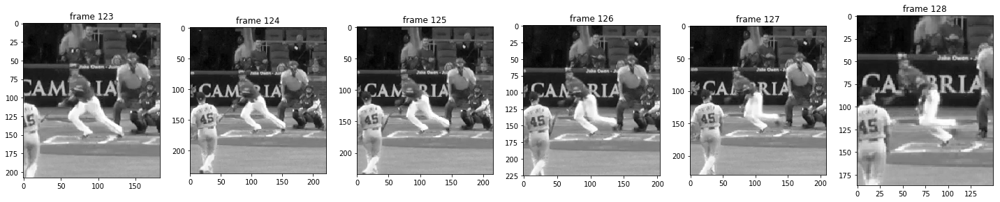


 
 
 

--------------NEW VIDEO ------------------
370e6609-6294-418c-8422-9192d7417f8d
length data (163, 12, 2)
first move not in json file
--------------START RUN: network: 0 , gradient:  119 ------------------


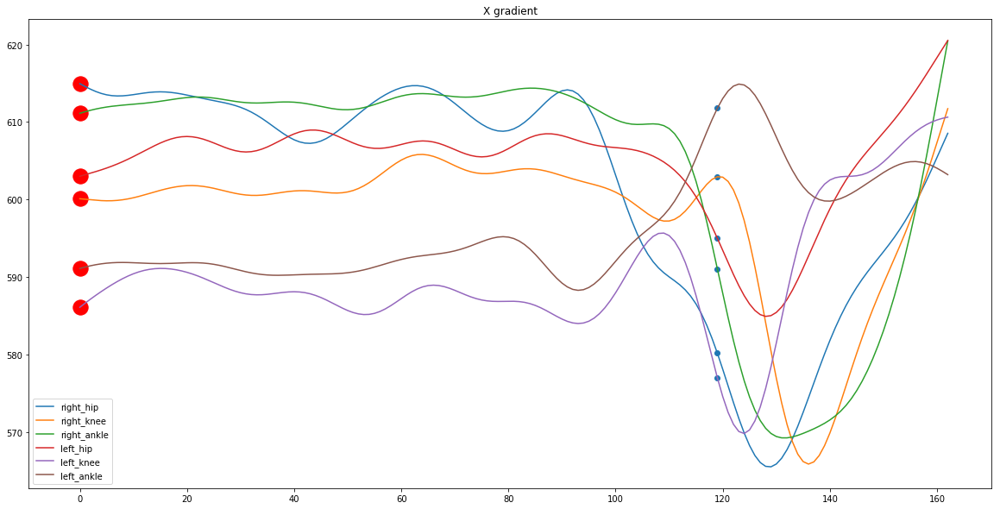

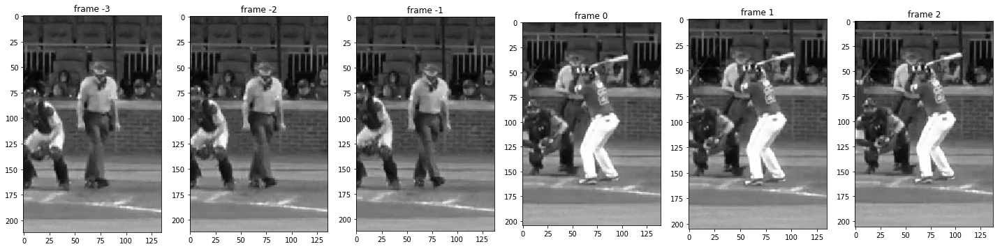


 
 
 

--------------NEW VIDEO ------------------
547fdb80-052f-4a89-a81d-97f8f00b5862
length data (166, 12, 2)
--------------START RUN: network: 121 , gradient:  125 ------------------


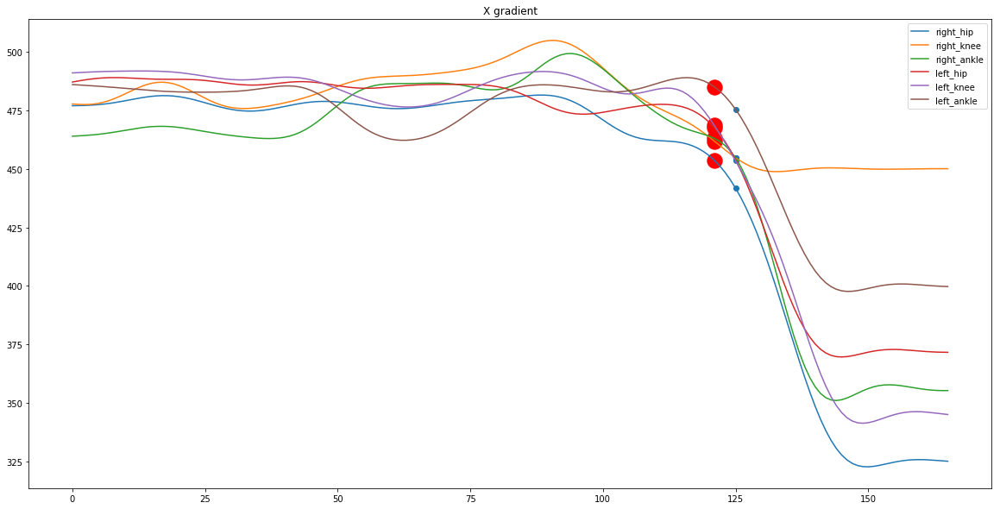

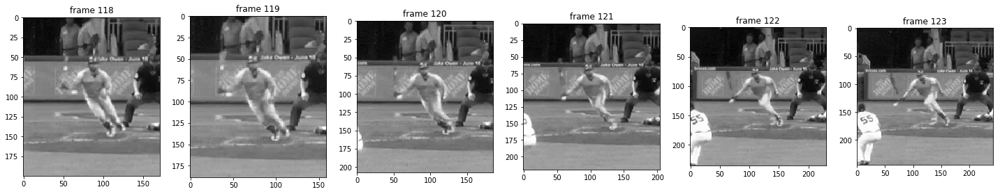


 
 
 

--------------NEW VIDEO ------------------
34a0f21f-bd68-494a-9306-d6708ff36d32
length data (166, 12, 2)
--------------START RUN: network: 122 , gradient:  123 ------------------


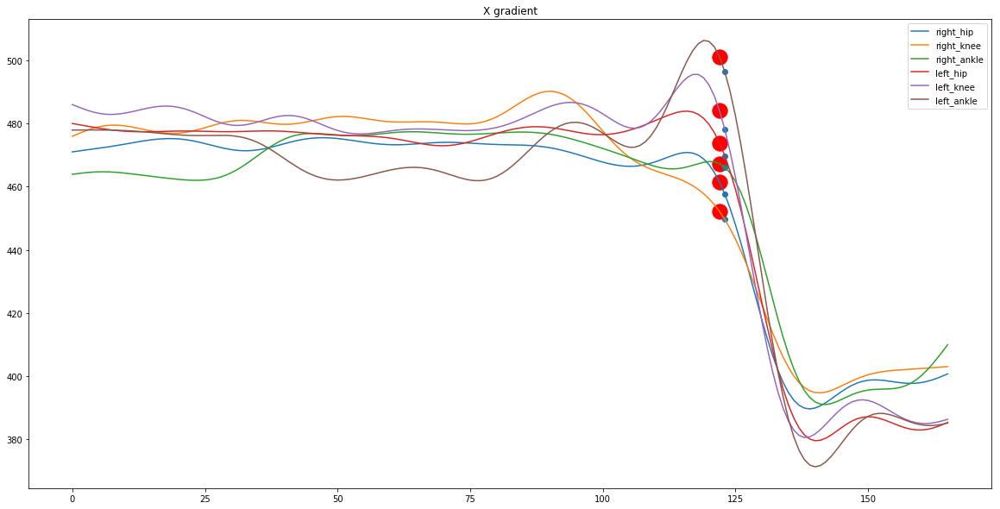

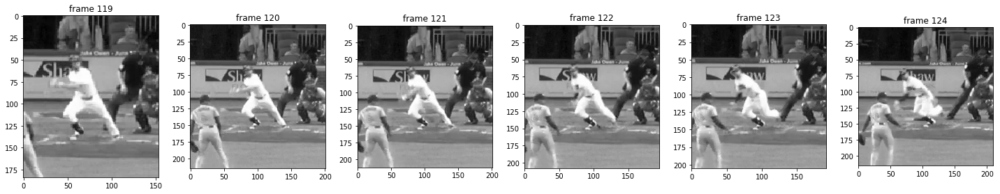


 
 
 

--------------NEW VIDEO ------------------
21f0822e-b084-4711-9b6c-0753c36cfc98
length data (166, 12, 2)
--------------START RUN: network: 124 , gradient:  129 ------------------


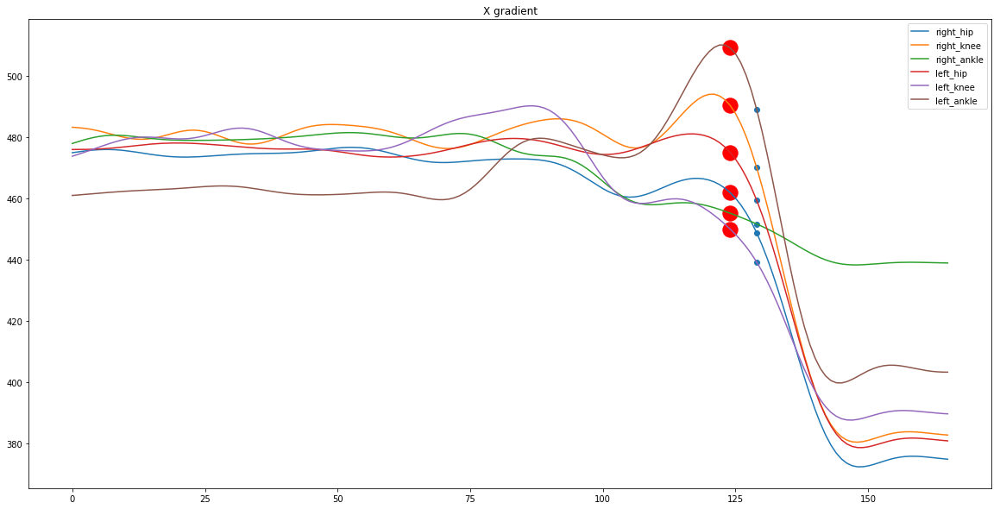

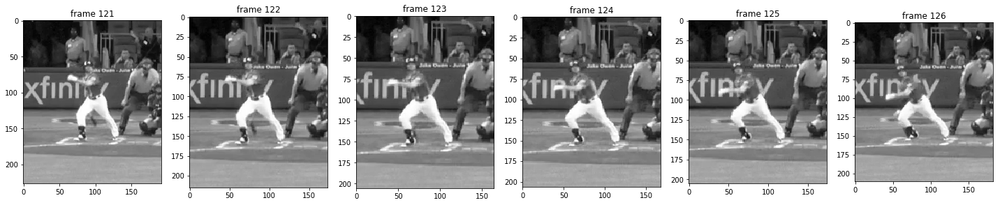


 
 
 

--------------NEW VIDEO ------------------
e618e1e1-1e2c-4033-b464-f10d795abb96
length data (163, 12, 2)
first move not in json file
--------------START RUN: network: 0 , gradient:  126 ------------------


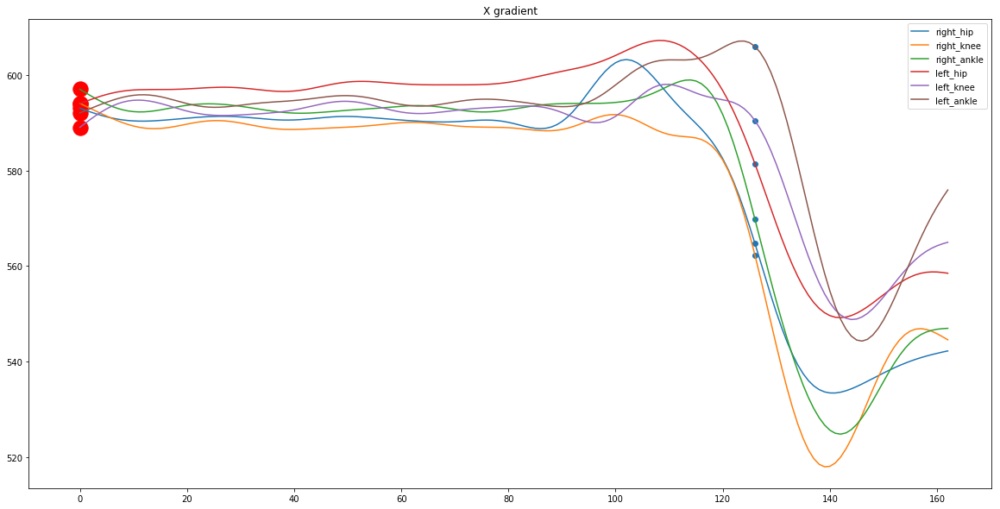

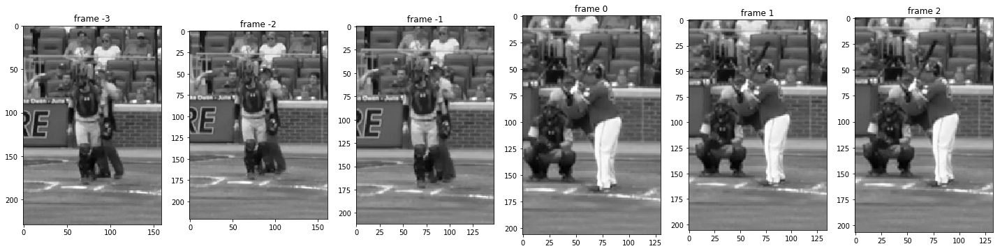


 
 
 

--------------NEW VIDEO ------------------
88e139ed-4ce2-41cb-b3c1-c0417c3809db
length data (165, 12, 2)
first move not in json file
--------------START RUN: network: 0 , gradient:  116 ------------------


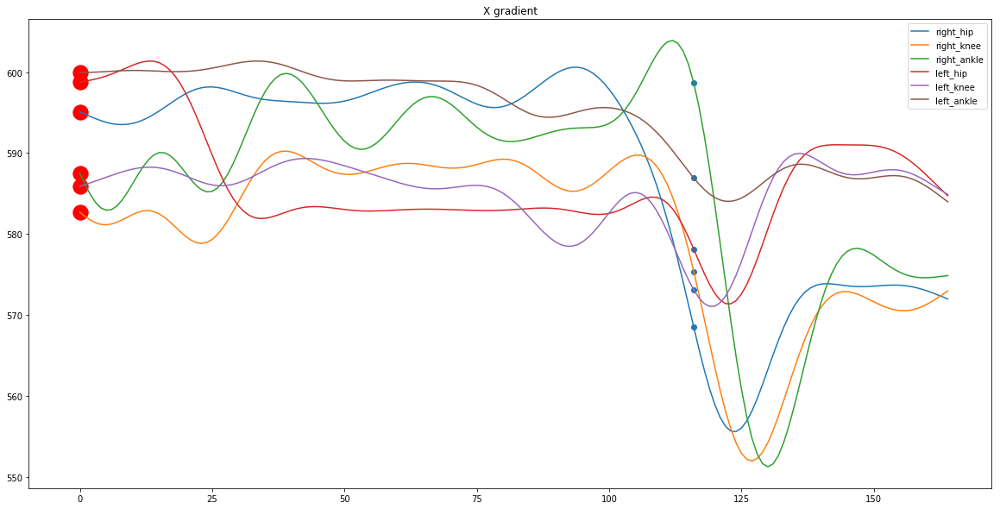

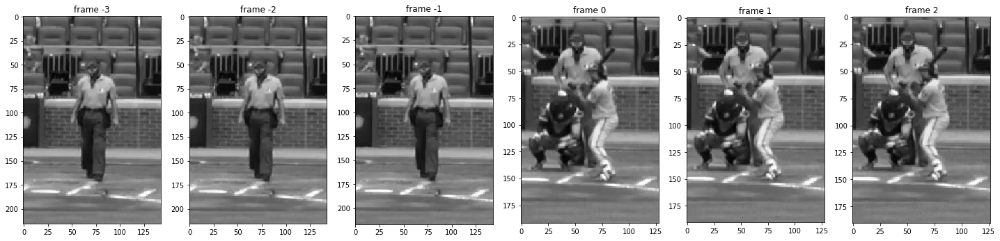


 
 
 

--------------NEW VIDEO ------------------
c1b55e15-67c2-4c5c-9f1e-6873d58a1f77
length data (163, 12, 2)
first move not in json file
--------------START RUN: network: 0 , gradient:  129 ------------------


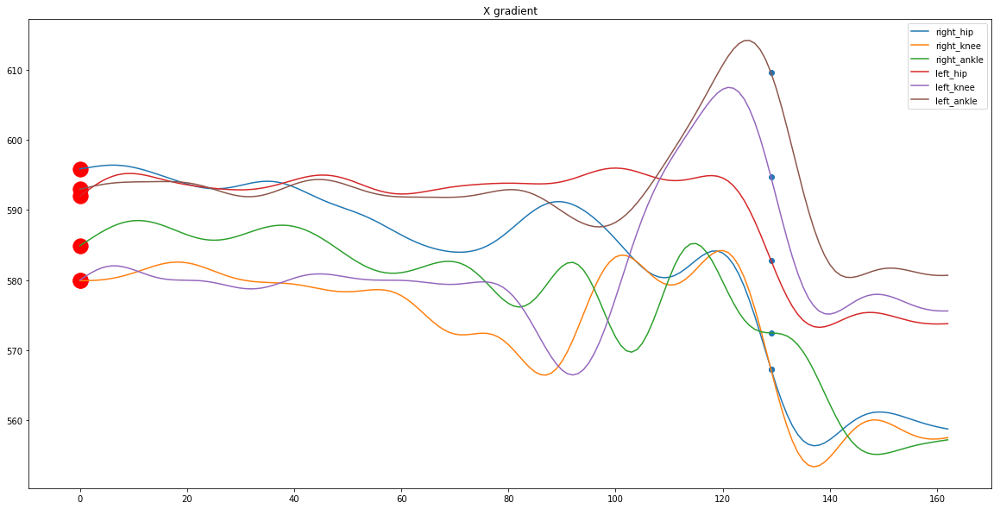

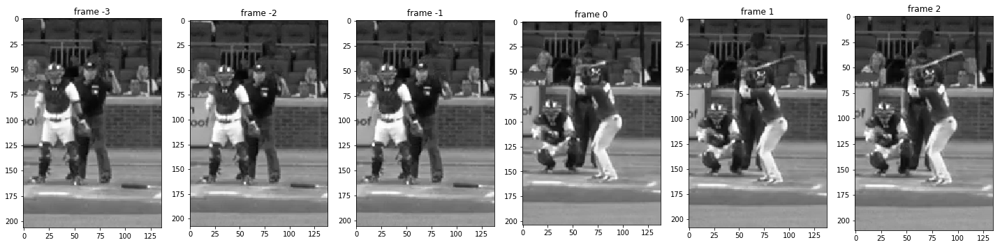


 
 
 

--------------NEW VIDEO ------------------
c22655a9-03a8-428d-a4bf-8fb55a0ac08d
length data (163, 12, 2)
--------------START RUN: network: 125 , gradient:  134 ------------------


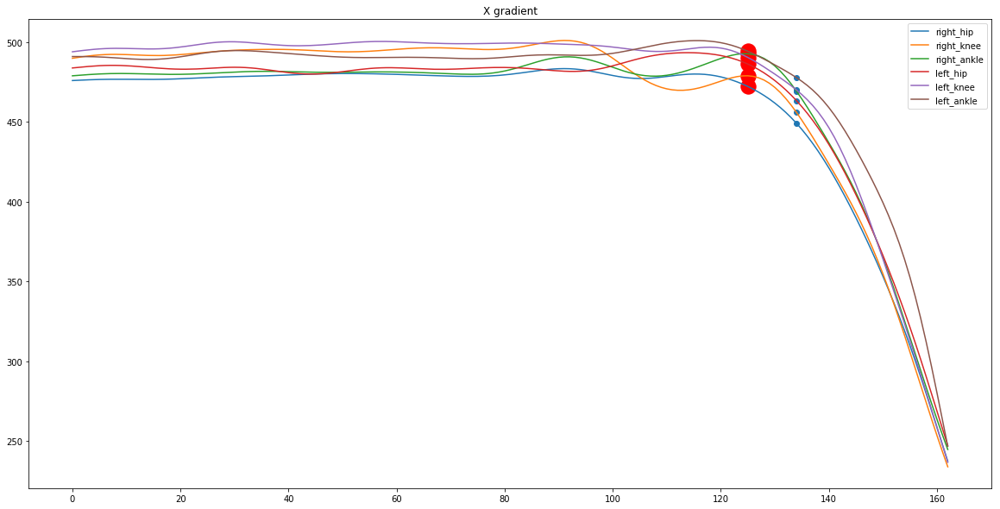

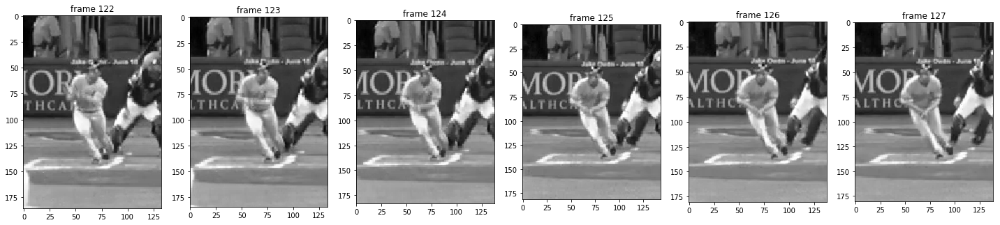


 
 
 

--------------NEW VIDEO ------------------
ed8a313c-2799-4006-8ac0-65a124677b35
length data (166, 12, 2)
--------------START RUN: network: 128 , gradient:  124 ------------------


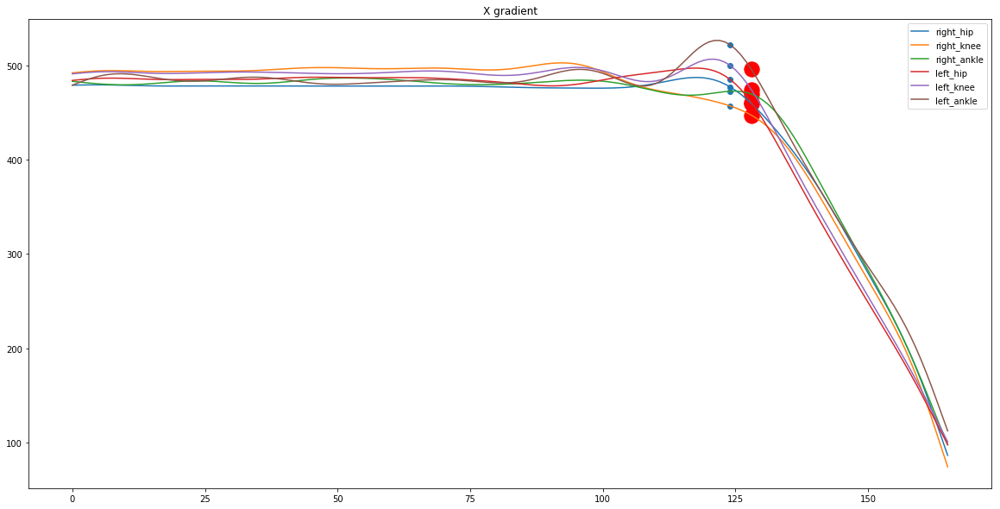

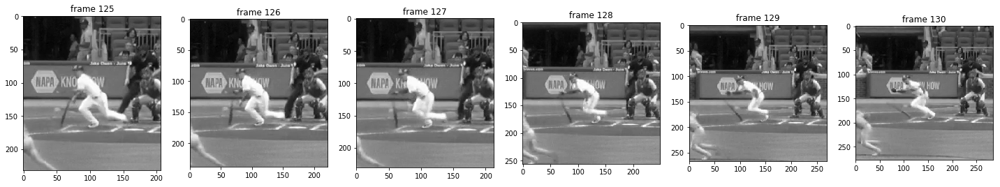


 
 
 

--------------NEW VIDEO ------------------
5735a9b9-f476-4bc6-b1c3-13ab814b232b
length data (166, 12, 2)
--------------START RUN: network: 130 , gradient:  132 ------------------


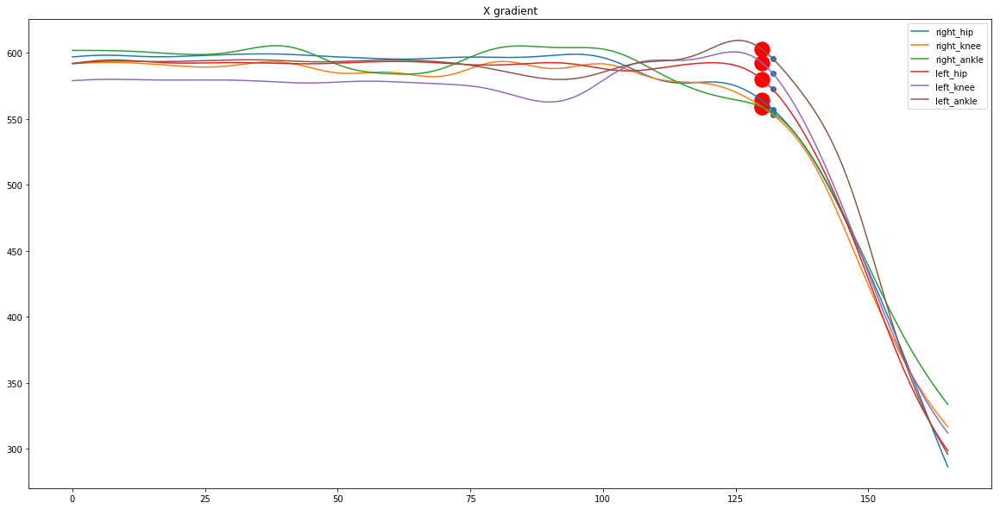

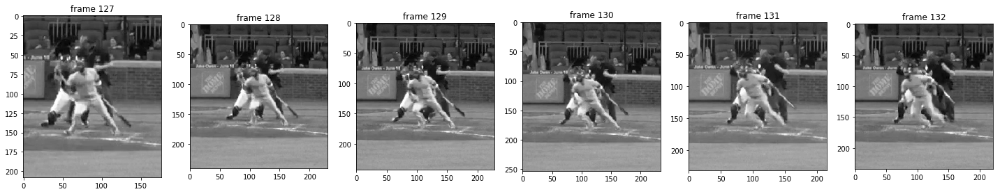


 
 
 

--------------NEW VIDEO ------------------
e6165bb7-dcad-412b-beb3-a0bd1210730f
length data (166, 12, 2)
--------------START RUN: network: 129 , gradient:  129 ------------------


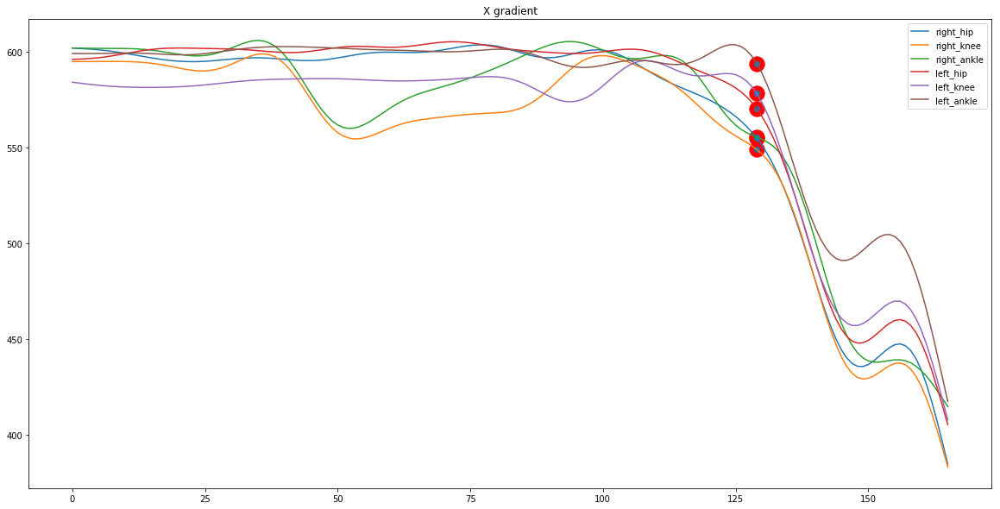

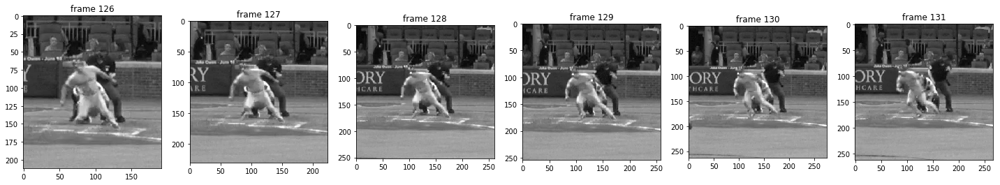


 
 
 

--------------NEW VIDEO ------------------
e4c265b8-796b-42d1-8295-e86e47b20c25
length data (166, 12, 2)
--------------START RUN: network: 121 , gradient:  124 ------------------


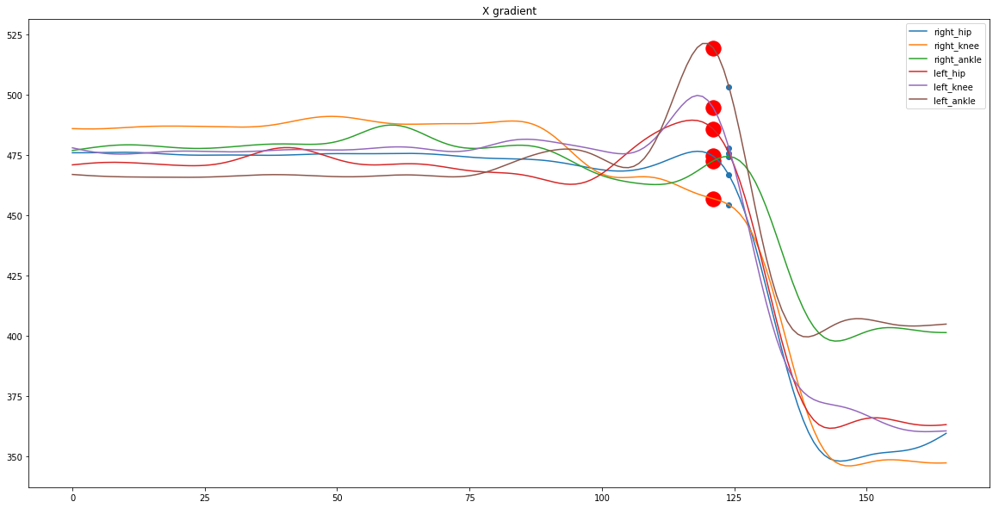

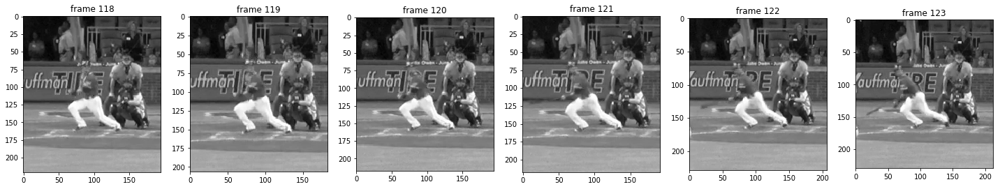


 
 
 

--------------NEW VIDEO ------------------
5048ec21-d47b-42c2-b279-312b088ebd9e
length data (166, 12, 2)
--------------START RUN: network: 126 , gradient:  128 ------------------


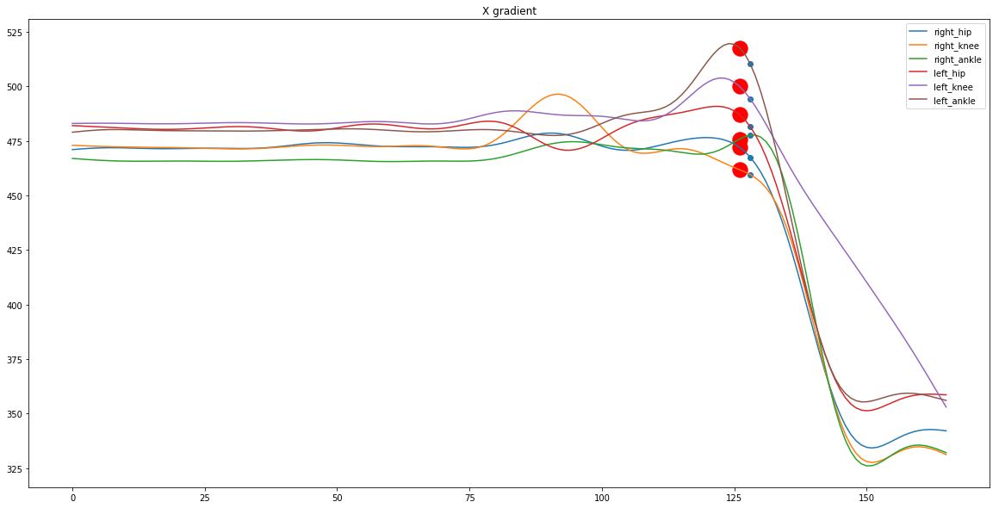

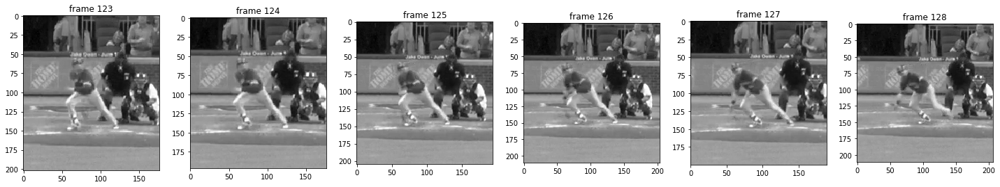

[]
{'3bca3062-d7aa-46c9-b729-85373e0dbd87': 124.0, 'e420776f-67d8-4833-96fd-88da20de95a1': 130.0, '88e139ed-4ce2-41cb-b3c1-c0417c3809db': 0.0, 'e618e1e1-1e2c-4033-b464-f10d795abb96': 0.0, 'ed8a313c-2799-4006-8ac0-65a124677b35': 128.0, '4343a6e2-17fd-45a6-891f-6619f1be9755': 125.0, '4ed99ce5-a558-445e-a83e-7b1608c9427e': 122.0, '547fdb80-052f-4a89-a81d-97f8f00b5862': 121.0, 'c1b55e15-67c2-4c5c-9f1e-6873d58a1f77': 0.0, 'c6ea2485-4ce1-4edd-b103-5cee4e9b22fb': 120.0, '2389e257-62e1-4b49-ac68-a360b0499960': 119.0, '21f0822e-b084-4711-9b6c-0753c36cfc98': 124.0, 'da908ac0-eae5-4742-a57e-8ccda56108e0': 125.0, '72d2b9d0-1fb0-469b-9f79-35b9502124ab': 113.0, '651bb6ba-c99b-4c16-a550-fee495a5bb59': 124.0, 'e4c265b8-796b-42d1-8295-e86e47b20c25': 121.0, '97507655-eed9-42d5-82b9-6da6c8349ba2': 126.0, 'f4ea3410-f559-464f-acb0-74133d7742e3': 127.0, 'e6165bb7-dcad-412b-beb3-a0bd1210730f': 129.0, '9c3e389f-32e8-4f3c-b9d3-8c525f8891eb': 123.0, 'c22655a9-03a8-428d-a4bf-8fb55a0ac08d': 125.0, '5735a9b9-f476-

NameError: name 'true' is not defined

In [101]:
wrong_guy = []#["b7b07ada-bc3e-45b9-a29e-8edbf8ae83d4"] # ["83764a69-2028-4530-8188-f7c37162d403", "46188b82-c795-42e4-8eb1-db3d616d3b4f",
# "889613f9-85f0-4043-864b-f0d486a9816e", "6f014362-1788-43d7-a3fe-91059be02304", "57544774-74dd-4d2c-a2c9-9221ab623d89"]

include_joints = 6
#temp = joints_array_batter[2, :, include_joints:12,:]
label = 118

#temp_grad = np.gradient(joints_array_batter[0, :, :12, 1], axis = 0)#
acc_by_grad = []
acc_dtak_single = []
acc_dtak_all_together = []
acc_dtak_with_y = []
acc_align_simple = []
acc_align_simple_all_coord = []
acc_dinf_null = []
acc_simple_shift = []
acc_neural_net = []

with open("labels_first_batter_test", "r") as infile:
    labels_first_move = json.load(infile)
# labels_first_move = {} 

with open("labels_testing_new", "r") as infile:
    labels_test = json.load(infile)
wrong_guy = []

#true_old = np.array([126, 130, 118, 126, 126, 120, 125, 127, 120, 126, 128, 122, 121, 120, 128, 122, 127, 124, 132])
# true = np.array([122, 130, 126, 128, 118, 119, 128, 130, 124, 121, 122, 120, 160, 123, 132, 122, 124])
for video_choice in range(len(joints_array_batter)):
    #if hit_into[video_choice]=="no" or "Foul" in play_outcome[video_choice] or files[video_choice] in wrong_guy or "Field out" in play_outcome[video_choice]:
     #   print(play_outcome[video_choice], files[video_choice])
        #  continue
    print("\n \n \n \n")
    print("--------------NEW VIDEO ------------------")
    print(files[video_choice])
    # print(play_outcome[video_choice])
    data = joints_array_batter[video_choice]
    print("length data", data.shape)
    
    # first2 = first_by_grad(joints_array_batter[video_choice, :,:, 0], joints_list[:12], 1)
    # first_move = min(first1, first2)
    # first_move = center_gravity(joints_array[video_choice, :, :12], joint_weights=np.array([1,1, 0.3,0, 0.3, 0, 1, 2,0.5, 1, 2, 0.5]), cutoff = 0.4)
    # grad_pitcher(joints_array_batter[video_choice,:,joints_list.index(j), 0])[0]

    """
    hit_start = first_by_grad(joints_array_batter[video_choice, :,:, 0], joints_list[:6], 1)
    
    print("--------------START HIT: ", hit_start, "------------------")
    
    #hit_ball = local_maxima(joints_array_batter[video_choice, :,:, 1], joints_list[6:12], 6)
    #print("--------------HIT BALL: ", hit_ball, "------------------")
    
    plt.figure(figsize = (20,10))
    for j in joints_list[:6]:
        plt.plot(np.gradient(joints_array_batter[video_choice,:,joints_list.index(j), 0]), label = j)
    plt.legend()
    #plt.ylim(200, 100)
    plt.title("Y gradient")
    plt.show()
    
    if hit_start is not None:
        fig = plt.figure(figsize=(20, 5))
        show_frames = range(hit_start, hit_start+5) #[17, 18, 19, 20, 21]
        for ind, i in enumerate(show_frames):
            ax = fig.add_subplot(1,len(show_frames),ind+1)
            plt.imshow(videos_b[video_choice,i])
            plt.gray()
            plt.title("frame "+str(i))
        plt.tight_layout()
        plt.show() 
    
    
 
    print("-----------------Hit into play? ", hit_into[video_choice], "-----------")
    
    grad = first_by_grad(data[:,:, 1], joints_list[:12], -4)
    if grad ==None:
        acc_by_grad.append(np.mean(true))
    else:
        acc_by_grad.append(grad)
    single_joints = dtak_nn_single_joints(data[:, include_joints:12,1], temp[:,:,1], label)
    acc_dtak_single.append(single_joints)
    # print("single_joints", first_move_single)
    acc_dtak_all_together.append(dtak_nn(data[:,include_joints:12,1], temp[:,:,1], label))
    
    resized = np.reshape(data[ :, include_joints:12,:], (167, 12))
    temp_resized = np.reshape(temp, (167, 12))
    
    acc_dtak_with_y.append(dtak_nn(resized, temp_resized, label))
    # print("mean with release frame", np.mean([first_move, release[video_choice]+30]))
    # grad = np.gradient(joints_array_batter[video_choice,:, :12,1], axis = 0)
    acc_align_simple.append(align_sequence_simple(data[:,include_joints:12,1], temp[:,:,1], label))
    # print("only y coord my alignment", first_move_align)
    acc_align_simple_all_coord.append(align_sequence_simple(resized, temp_resized, label))
    acc_dinf_null.append(find_null(resized))
     
    shift = simple_shift(resized, temp_resized, label)
    acc_simple_shift.append(shift)
    acc_neural_net.append(int(labels_test[files[video_choice]]))
    first_move = int(labels_test[files[video_choice]])
    
    if first_move==None:
        print("first move none")
        continue
    labels_first_move[files[video_choice]]=float(first_move)
    
    """
    
    try:
        first_move = int(labels_test[files[video_choice]])
    except KeyError:
        print("first move not in json file")
        first_move = 0
    gradient_label = first_by_grad(data, cutoff=4) #int(labels_test[files[video_choice]]) #
    
    if first_move is not None:
        labels_first_move[files[video_choice]] = float(first_move)
        show_frames = range(first_move-3, first_move+3)
    else:
        wrong_guy.append(files[video_choice])
        first_move = 0
        show_frames = [0,5, 60, 120, 130, 140]
        
        
    print("--------------START RUN: network:", first_move, ", gradient: ", gradient_label, "------------------")
    plt.figure(figsize = (20,10))
    for j in joints_list[6:12]:
        plt.plot(data[:,joints_list.index(j), 0], label = j)
    plt.legend()
    plt.scatter([first_move for _ in range(include_joints)], data[first_move, include_joints:12, 0],  color = "red", s=300)
    plt.scatter([gradient_label for _ in range(include_joints)], data[gradient_label, include_joints:12, 0])
    #plt.ylim(-3, 3)
    plt.title("X gradient")
    plt.show()
    
    
    fig = plt.figure(figsize=(20, 5))
     #[17, 18, 19, 20, 21]
    for ind, i in enumerate(show_frames):
        ax = fig.add_subplot(1,len(show_frames),ind+1)
        plt.imshow(videos_b[video_choice][i])
        plt.gray()
        plt.title("frame "+str(i))
    plt.tight_layout()
    plt.show()

print(wrong_guy)
print(labels_first_move)

# true = np.delete(true, 12)
print("acc_dtak_single", np.mean(np.absolute(true-acc_dtak_single)), np.absolute(true-acc_dtak_single))
print("acc_dtak_all_together", np.mean(np.absolute(true-acc_dtak_all_together)), np.absolute(true-acc_dtak_all_together))
print("acc_dtak_with_y", np.mean(np.absolute(true-acc_dtak_with_y)), np.absolute(true-acc_dtak_with_y))
print("acc_align_simple", np.mean(np.absolute(true-acc_align_simple)), np.absolute(true-acc_align_simple))
print("acc_align_simple_all_coord", np.mean(np.absolute(true-acc_align_simple_all_coord)), np.absolute(true-acc_align_simple_all_coord))
print("acc_dinf_null", np.mean(np.absolute(true-acc_dinf_null)), np.absolute(true-acc_dinf_null))
print("acc_simple_shift", np.mean(np.absolute(true-acc_simple_shift)), np.absolute(true-acc_simple_shift))
print("acc_by_grad", np.mean(np.absolute(true-acc_by_grad)), np.absolute(true-acc_by_grad))
print("acc_neural_net", np.mean(np.absolute(true-acc_neural_net)), np.absolute(true-acc_neural_net))

### Save labels in dictionary to create a database of labeled data

In [71]:
print(len(list(labels_first_move.keys())))

# labels_first_move["d5333e26-5deb-4089-b797-d34e4f174e88"] =120

#with open("labels_first_batter_test", "w") as outfile:
 #   json.dump(labels_first_move, outfile)


#with open("labels_first_move_new", "w") as outfile:
#    json.dump(labels_first_move, outfile)

21


# Check data used for training batter's first movement (saved in file batter_first_move_train.py)

In [97]:
data = np.load("outputs/batter_first_data.npy")
label = np.load("outputs/batter_first_label.npy")

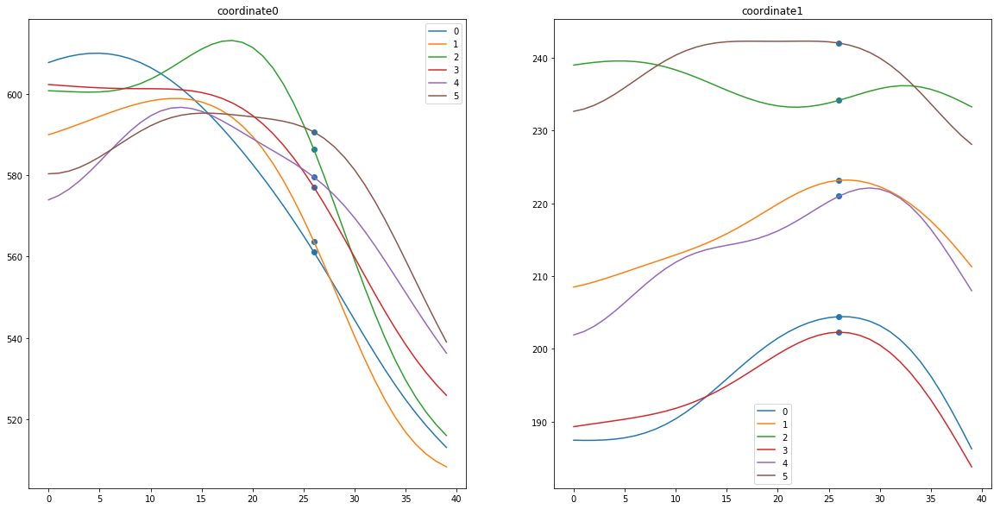

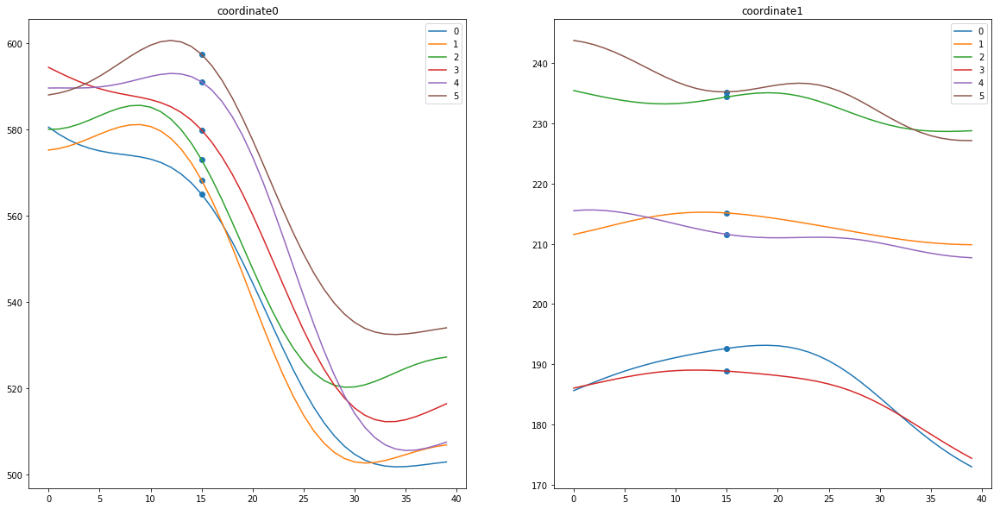

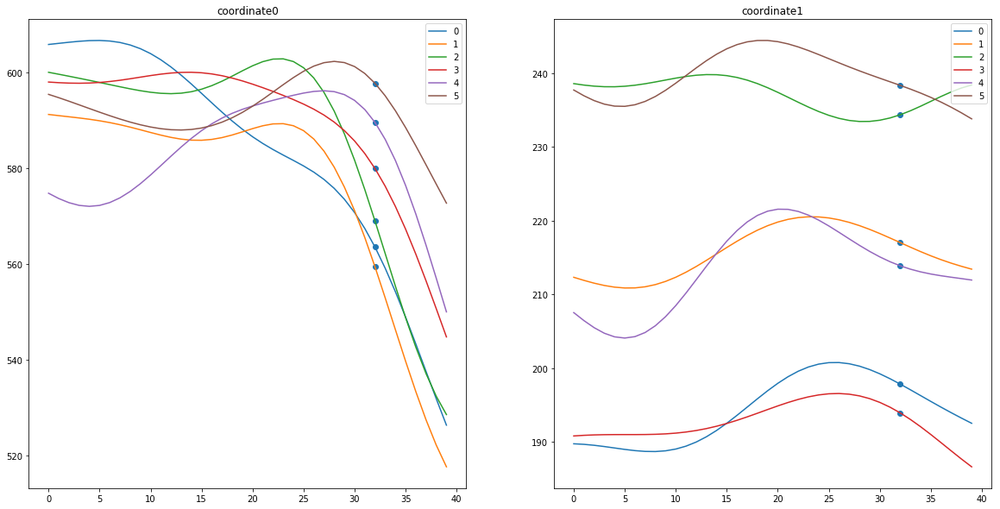

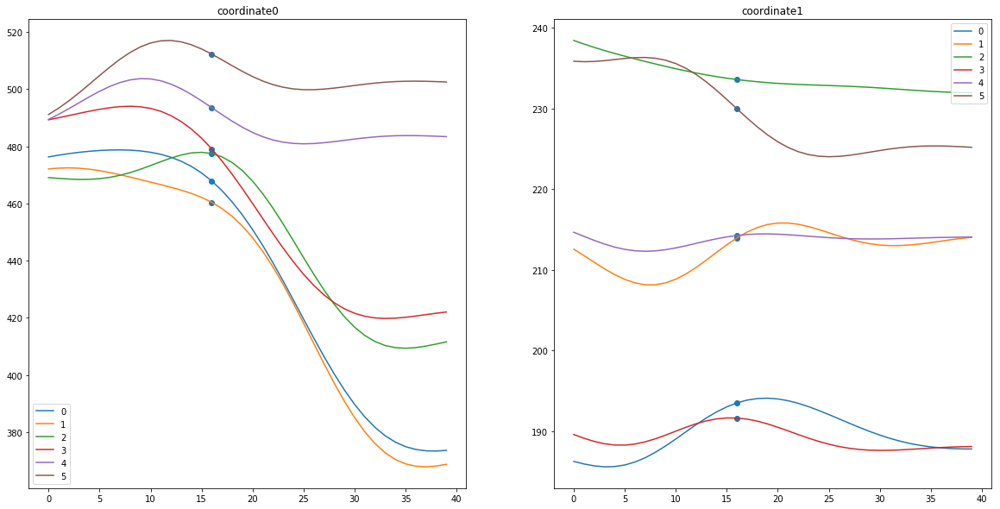

KeyboardInterrupt: 

In [99]:
for i in range(100, len(data)):
    plt.figure(figsize = (20,10))
    for k in range(2):
        first_move = label[i]
        if first_move==len(data[0]):
            print("same")
            continue
        plt.subplot(1,2,k+1)
        for j in range(6):
            plt.plot(data[i,:,j, k], label = j)
        plt.legend()
        plt.scatter(np.array([int(first_move) for _ in range(6)]).astype(int), np.array(data[i, int(first_move), list(np.arange(0,6,1)),k]))
        plt.title("coordinate"+str(k))
    plt.show()

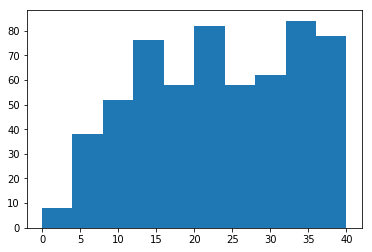

In [98]:
#plt.hist(label[57:])
#plt.show()

plt.hist(label)
plt.show()